In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
282,2021-10-16,0.000
283,2021-10-17,0.754
284,2021-10-18,0.333
285,2021-10-19,0.458


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-11-06    0.000
2021-11-07    0.754
2021-11-08    0.333
2021-11-09    0.458
2021-11-10    1.931
Name: Vacunas, Length: 287, dtype: float64

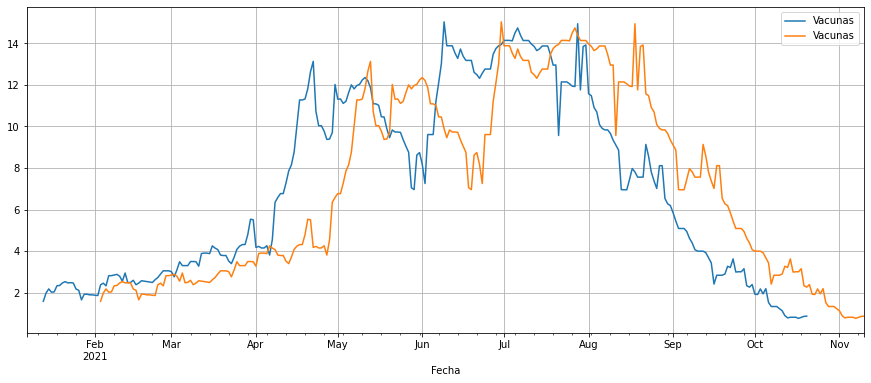

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

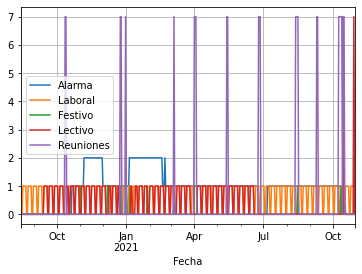

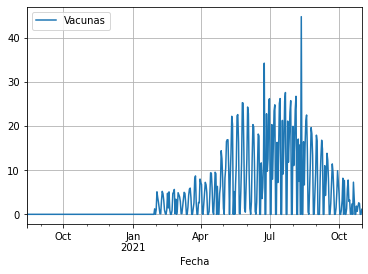

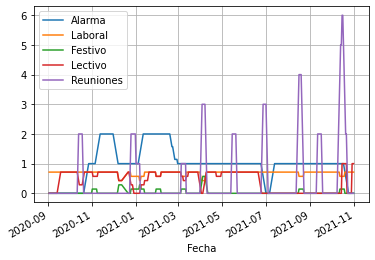

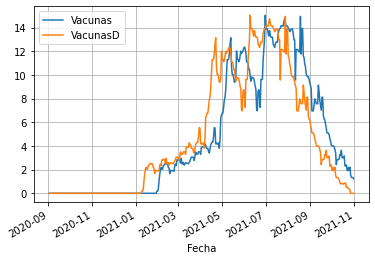

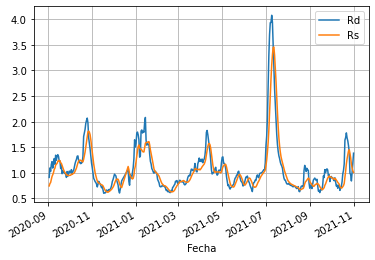

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
#puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/10/31':'2020/10/30','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/11/1','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']


puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1
puntos.loc['2021-10-12','Festivo']=1
#puntos.loc['2021-11-1','Festivo']=1



puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0
puntos.loc['2021/10/15':'2021/10/16','Lectivo']=7
puntos.loc['2021-10-29':'2021-10-30','Lectivo']=7
#puntos.loc['2021-11-1','Lectivo']=7

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
#puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7
puntos.loc['2021/10/9':'2021/10/13','Reuniones']=7
puntos.loc['2021/10/15':'2021/10/16','Reuniones']=7
#puntos.loc['2021-11-1','Reuniones']=7


puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail(20).T

Fecha,2021-10-12,2021-10-13,2021-10-14,2021-10-15,2021-10-16,2021-10-17,2021-10-18,2021-10-19,2021-10-20,2021-10-21,2021-10-22,2021-10-23,2021-10-24,2021-10-25,2021-10-26,2021-10-27,2021-10-28,2021-10-29,2021-10-30,2021-10-31
Día de la semana,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000
Casos,26.000000,57.000000,5.400000e+01,74.000000,34.000000,30.000000,87.000000,93.000000,72.000000,8.100000e+01,58.000000,39.000000,23.000000,68.000000,66.000000,77.000000,5.100000e+01,111.000000,94.000000,50.000000
test coresp,921.000000,1950.000000,1.907000e+03,1215.000000,584.000000,984.000000,2256.000000,2649.000000,2619.000000,2.119000e+03,1207.000000,514.000000,942.000000,2404.000000,2301.000000,2443.000000,1.792000e+03,1578.000000,1537.000000,1173.000000
Nº de pacientes a los que se ha realizado pruebas,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
Tasa de positividad (%),2.820000,2.920000,2.830000e+00,6.090000,5.820000,3.050000,3.860000,3.510000,2.750000,3.820000e+00,4.810000,7.590000,2.440000,2.830000,2.870000,3.150000,2.850000e+00,7.030000,6.120000,4.260000
Asintomáticos,22.100000,35.910000,3.294000e+01,40.700000,28.900000,24.000000,65.250000,58.590000,40.320000,4.860000e+01,35.960000,28.080000,19.780000,53.040000,37.620000,53.900000,2.601000e+01,64.380000,88.360000,32.000000
Zaragoza,21.000000,41.000000,4.200000e+01,60.000000,28.000000,25.000000,70.000000,63.000000,56.000000,5.300000e+01,41.000000,25.000000,19.000000,42.000000,49.000000,43.000000,3.100000e+01,65.000000,58.000000,38.000000
1 a 14 años,4.000000,13.000000,1.100000e+01,17.000000,7.000000,5.000000,15.000000,10.000000,14.000000,1.500000e+01,6.000000,4.000000,0.000000,11.000000,16.000000,11.000000,5.000000e+00,20.000000,6.000000,3.000000
15 a 24 años,0.000000,3.000000,2.000000e+00,4.000000,1.000000,1.000000,2.000000,5.000000,8.000000,6.000000e+00,1.000000,3.000000,0.000000,2.000000,3.000000,3.000000,4.000000e+00,4.000000,2.000000,2.000000
25 a 34 años,1.000000,7.000000,5.000000e+00,9.000000,4.000000,2.000000,10.000000,9.000000,5.000000,6.000000e+00,6.000000,0.000000,3.000000,5.000000,6.000000,15.000000,1.000000e+01,21.000000,21.000000,5.000000


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-11-02,2021-11-03,2021-11-04,2021-11-05,2021-11-06,2021-11-07,2021-11-08,2021-11-09,2021-11-10,2021-11-11
Día de la semana,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00
Casos,105.000000,144.000000,1.230000e+02,152.000000,80.000000,49.000000,131.000000,155.000000,171.000000,NaN
test coresp,2285.000000,2600.000000,2.094000e+03,3067.000000,2237.000000,937.000000,2461.000000,2626.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
Tasa de positividad (%),4.600000,5.540000,5.870000e+00,4.960000,3.580000,5.230000,5.320000,5.900000,NaN,NaN
Asintomáticos,59.850000,48.960000,6.888000e+01,80.560000,68.000000,29.400000,70.740000,91.450000,NaN,NaN
Zaragoza,60.000000,119.000000,1.010000e+02,116.000000,68.000000,34.000000,72.000000,108.000000,NaN,NaN
1 a 14 años,19.000000,38.000000,2.300000e+01,36.000000,19.000000,7.000000,15.000000,23.000000,NaN,NaN
15 a 24 años,2.000000,6.000000,1.000000e+01,13.000000,4.000000,4.000000,11.000000,14.000000,NaN,NaN
25 a 34 años,15.000000,15.000000,1.600000e+01,10.000000,7.000000,6.000000,13.000000,19.000000,NaN,NaN


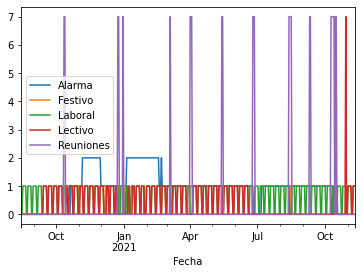

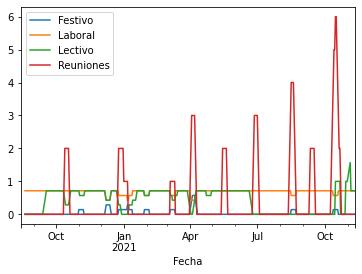

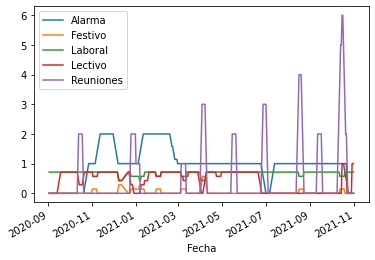

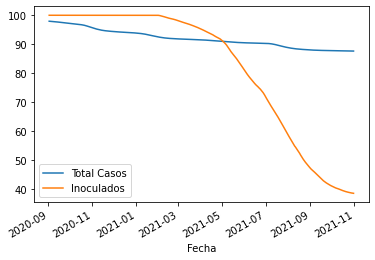

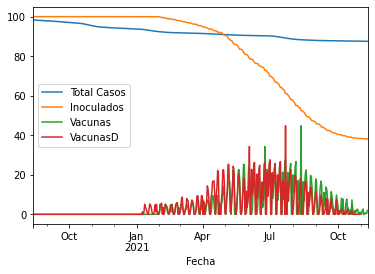

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

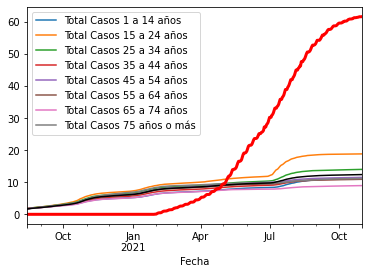

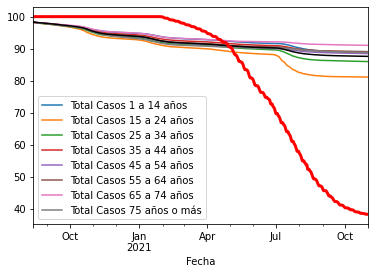

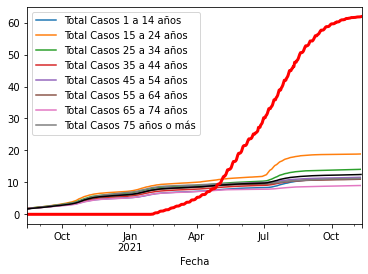

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-11-07,87.557019,38.193688
2021-11-08,87.547090,38.183386
2021-11-09,87.535341,38.169216


,Total Casos,Inoculados
Fecha,,
2021-11-01,87.606516,38.360012
2021-11-02,87.598557,38.356608
2021-11-03,87.587642,38.299125
2021-11-04,87.578319,38.217016
2021-11-05,87.566797,38.217016
2021-11-06,87.560733,38.217016
2021-11-07,87.557019,38.193688
2021-11-08,87.547090,38.183386
2021-11-09,87.535341,38.169216


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-01,1,23.0,883.0,0.0,2.60,16.79,19.0,2.0,0.0,5.0,...,38.360012,87.606516,88.779132,81.162679,85.986206,88.898576,88.462002,89.083952,91.043009,88.801865
2021-11-02,2,105.0,2285.0,0.0,4.60,59.85,60.0,19.0,2.0,15.0,...,38.356608,87.598557,88.768836,81.161064,85.975622,88.884616,88.455212,89.078862,91.038571,88.795882
2021-11-03,3,144.0,2600.0,0.0,5.54,48.96,119.0,38.0,6.0,15.0,...,38.299125,87.587642,88.748245,81.156220,85.965037,88.874146,88.444056,89.070379,91.028214,88.788569
2021-11-04,4,123.0,2094.0,0.0,5.87,68.88,101.0,23.0,10.0,16.0,...,38.217016,87.578319,88.735782,81.148147,85.953746,88.861184,88.435810,89.061896,91.023776,88.782585
2021-11-05,5,152.0,3067.0,0.0,4.96,80.56,116.0,36.0,13.0,10.0,...,38.217016,87.566797,88.716274,81.137652,85.946689,88.850714,88.424654,89.048323,91.013419,88.775937
2021-11-06,6,80.0,2237.0,0.0,3.58,68.00,68.0,19.0,4.0,7.0,...,38.217016,87.560733,88.705978,81.134423,85.941750,88.843734,88.420774,89.040406,91.008241,88.771284
2021-11-07,7,49.0,937.0,0.0,5.23,29.40,34.0,7.0,4.0,6.0,...,38.193688,87.557019,88.702185,81.131194,85.937516,88.842238,88.416409,89.034750,91.006022,88.766630
2021-11-08,1,131.0,2461.0,0.0,5.32,70.74,72.0,15.0,11.0,13.0,...,38.183386,87.547090,88.694057,81.122314,85.928342,88.827780,88.409133,89.027398,90.994925,88.753334
2021-11-09,2,155.0,2626.0,0.0,5.90,91.45,108.0,23.0,14.0,19.0,...,38.169216,87.535341,88.681593,81.111012,85.914935,88.814319,88.398947,89.017784,90.980870,88.743362


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-07,7,49.0,937.0,0.0,5.23,29.40,34.0,7.0,4.0,6.0,...,91.006022,88.766630,17712.0,21267.0,17519.0,18970.0,20377.0,16383.0,9860.0,14340.0
2021-11-08,1,131.0,2461.0,0.0,5.32,70.74,72.0,15.0,11.0,13.0,...,90.994925,88.753334,17727.0,21278.0,17532.0,18999.0,20392.0,16396.0,9875.0,14360.0
2021-11-09,2,155.0,2626.0,0.0,5.90,91.45,108.0,23.0,14.0,19.0,...,90.980870,88.743362,17750.0,21292.0,17551.0,19026.0,20413.0,16413.0,9894.0,14375.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    #'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.874973,0.954524,0.918289,0.870700,0.977093,0.801826,0.917880,0.754297,0.830416,0.865867,...,1,1,1.000101,1.000183,1.000110,1.000086,1.000082,1.000077,1.000048,1.000056
2,1.196076,1.216352,0.974076,1.166895,0.973808,1.202397,1.001674,1.255777,1.161884,1.179954,...,1,1,1.000055,1.000115,1.000056,1.000036,1.000040,1.000031,1.000030,1.000036
3,1.186381,1.232703,0.963032,1.176427,0.989567,1.202609,1.013842,1.215301,1.260340,1.188172,...,1,1,1.000007,1.000011,1.000004,0.999990,0.999995,0.999989,1.000006,1.000018
4,1.199773,1.138413,1.053771,1.216023,1.011859,1.208593,1.011398,1.222285,1.259885,1.202547,...,1,1,0.999957,0.999904,0.999944,0.999960,0.999956,0.999960,0.999974,0.999968
5,1.128365,1.093608,1.040738,1.056632,0.933038,1.137411,1.015467,1.159716,1.160666,1.174872,...,1,1,0.999907,0.999811,0.999890,0.999919,0.999918,0.999929,0.999946,0.999940
6,0.831762,0.786841,1.085322,0.915721,1.094055,0.872834,1.047770,0.902038,0.806903,0.812347,...,1,1,0.999927,0.999879,0.999931,0.999956,0.999952,0.999960,0.999963,0.999955
7,0.543258,0.565279,0.944981,0.555122,1.014475,0.538104,0.992992,0.454592,0.488954,0.525414,...,1,1,1.000040,1.000080,1.000058,1.000047,1.000051,1.000046,1.000026,1.000020


Casos                        0.994370
test coresp                  0.998246
Tasa de positividad (%)      0.997173
Asintomáticos                0.993931
Asintomáticos (%)            0.999128
Zaragoza                     0.994825
Zaragoza (%)                 1.000146
1 a 14 años                  0.994858
15 a 24 años                 0.995578
25 a 34 años                 0.992739
35 a 44 años                 0.993098
45 a 54 años                 0.995158
55 a 64 años                 0.993192
65 a 74 años                 0.995667
75 años o más                0.989652
Camas Ocup                   0.998085
Camas libres                 0.999946
Camas (%)                    0.997220
UCI ocupadas                 0.998788
UCI libres con resp          0.999609
UCI (%)                      0.997828
Rs                           1.000000
Rd                           1.000000
Inoculados                   1.000000
Total Casos                  1.000000
Total Casos 1 a 14 años      0.999999
Total Casos 

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-10-27    0.927928
2021-10-28    0.811040
2021-10-29    0.956044
2021-10-30    1.065217
2021-10-31    1.141280
Name: Casos, Length: 444, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-11-01         NaN
2021-11-02    4.565217
2021-11-03    1.371429
2021-11-04    0.854167
2021-11-05    1.235772
2021-11-06    0.526316
2021-11-07    0.612500
2021-11-08    2.673469
2021-11-09    1.183206
2021-11-10    1.103226
2021-11-11         NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,0.978313,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,0.823529,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,0.921569,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,33.428571,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,31.714286,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,34.000000,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,33.857143,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,32.000000,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-27,58.857143,1704.285714,3.930000,39.568571,69.285714,38.857143,67.812043,9.000000,2.571429,5.857143,...,38.615627,87.645194,88.814432,81.177902,86.045583,88.935826,88.506487,89.121763,91.082111,88.835675
2021-10-28,54.571429,1657.571429,3.791429,36.341429,68.000000,35.714286,67.148074,7.571429,2.285714,6.428571,...,38.574209,87.641058,88.810329,81.176057,86.041046,88.931339,88.501498,89.117481,91.077461,88.832541
2021-10-29,62.142857,1710.571429,4.108571,40.401429,67.428571,39.142857,65.415060,9.571429,2.714286,8.571429,...,38.532792,87.636348,88.805142,81.173865,86.034998,88.926211,88.496163,89.112956,91.073022,88.829027


<AxesSubplot:xlabel='Fecha'>

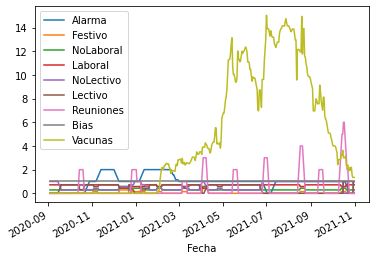

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 65.7 ms, sys: 11.4 ms, total: 77.1 ms
Wall time: 12.5 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000226,-0.000007,-0.008285,-0.000485,0.002772,-0.000418,-0.001093,-0.001251,0.000760,0.001256,...,1.028015,0.007814,0.023661,-4.056782,-3.917175,-3.981833,-3.992123,0.002681,-7.973956,0.001949
2020-09-04,0.000384,0.000024,-0.003804,-0.000496,0.002021,-0.000162,-0.000813,-0.001825,0.000021,0.000796,...,0.872323,0.005627,-0.015413,-4.596375,-4.562967,-4.573434,-4.585908,0.004427,-9.159343,0.000307
2020-09-05,0.000939,0.000002,-0.005551,-0.000592,0.003292,-0.000635,-0.000173,-0.001072,0.000197,0.000186,...,0.660564,0.009223,0.041762,-2.632848,-2.503579,-2.558971,-2.577456,0.000645,-5.136427,0.001372
2020-09-06,-0.000056,-0.000018,-0.006307,-0.000266,0.002177,0.000261,-0.000210,-0.000628,0.000521,0.001308,...,0.567276,-0.000752,0.023542,-2.330114,-2.251623,-2.282997,-2.298739,0.000045,-4.581736,-0.000233
2020-09-07,0.000287,-0.000008,-0.001249,-0.000086,0.000336,0.000401,0.001123,-0.000980,-0.000429,0.000344,...,0.262396,-0.004794,0.025285,-1.777441,-1.719484,-1.740217,-1.756708,0.000035,-3.496925,-0.002832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-27,0.000619,0.000002,0.003945,0.000173,0.000732,-0.000219,-0.000062,-0.000090,-0.000566,-0.000704,...,-0.043302,-0.026302,0.009449,0.734520,0.811987,0.785417,0.761090,-0.001557,1.546507,0.001267
2021-10-28,0.000113,-0.000011,0.000593,-0.000077,0.002132,0.000236,-0.002294,0.000534,-0.000038,-0.000091,...,-0.005424,-0.023754,0.008389,1.303259,1.402756,1.367791,1.338224,-0.001371,2.706015,0.000721
2021-10-29,-0.000295,-0.000023,-0.000020,0.000148,0.001120,0.000527,-0.002690,0.000909,0.000422,0.000178,...,-0.072842,-0.032058,0.005564,2.023934,2.117939,2.083703,2.058170,-0.002178,4.141873,-0.000323



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


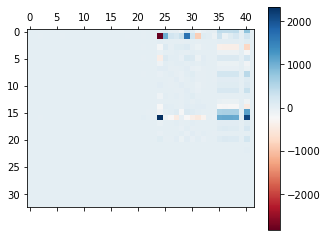

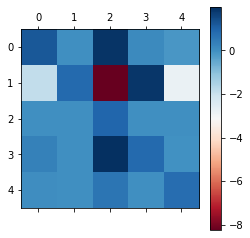

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(42, 416) = (42, 42)·(42, 42)·(42, 416)
CPU times: user 27.5 ms, sys: 12.1 ms, total: 39.6 ms
Wall time: 6.29 ms


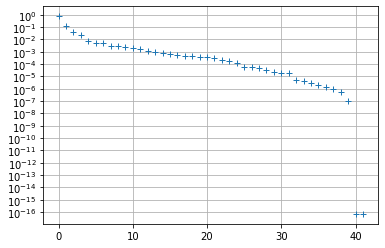

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{32}$,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$
Casos,-0.116358,0.248198,-0.161999,-0.672567,-0.086592,0.036061,0.044066,-0.033943,-0.410673,0.100384,...,-0.000443,-0.001579,-0.001649,-0.000107,-0.000174,-5.630489e-05,-0.000033,-5.324276e-06,2.654308e-18,2.982160e-18
test coresp,-0.886690,0.334888,-0.089680,0.302849,-0.003015,-0.018535,-0.002495,0.013790,-0.009336,-0.029710,...,0.000046,0.000069,-0.000019,-0.000007,-0.000002,2.531505e-05,-0.000008,2.912907e-06,-2.730623e-19,-1.150060e-19
Tasa de positividad (%),-0.003455,0.000833,-0.001226,-0.023919,0.013595,0.004477,-0.014779,0.019245,-0.023500,0.011834,...,0.002670,0.001329,-0.004163,0.006004,0.001253,6.952847e-03,-0.000841,4.401568e-04,2.116044e-17,-5.569190e-17
Asintomáticos,-0.058860,0.132477,-0.104464,-0.335770,-0.105426,-0.203144,0.362480,-0.201605,0.727814,0.024427,...,-0.000353,0.000162,0.000426,0.000238,0.000289,7.243866e-05,0.000047,-4.784544e-06,1.598789e-18,-2.669363e-20
Asintomáticos (%),-0.014801,-0.026217,-0.002863,0.013086,-0.090329,-0.051685,0.093808,-0.352359,0.114748,0.045060,...,0.003550,-0.000736,-0.000303,0.000010,-0.001198,3.837018e-04,-0.000100,-2.679566e-05,-9.846598e-18,1.012111e-18
Zaragoza,-0.081487,0.158612,-0.109164,-0.417026,0.026686,0.211039,-0.304814,0.241372,0.153926,-0.044358,...,-0.001042,0.000201,0.000541,-0.000002,-0.000223,5.737972e-05,-0.000094,-1.499119e-05,1.280035e-18,8.644806e-18
Zaragoza (%),-0.021206,-0.042500,0.003986,0.033351,-0.042498,0.182163,-0.145485,-0.107129,0.142491,0.240655,...,-0.001782,-0.001505,0.000673,0.000738,-0.000262,-1.599478e-04,-0.000334,5.035759e-05,3.229206e-18,-2.928754e-17
1 a 14 años,-0.014097,0.023488,-0.027255,-0.041295,-0.059377,-0.321176,0.046044,0.325770,-0.012417,0.512964,...,0.000054,-0.002453,0.001204,0.000997,0.000751,-3.485743e-04,0.000424,-2.860716e-05,8.629282e-18,9.768996e-18
15 a 24 años,-0.017808,0.036901,-0.186168,-0.135092,0.810321,0.043424,-0.034840,-0.288566,-0.092264,-0.083902,...,0.000922,0.000849,0.001849,0.000069,-0.000029,-4.124225e-05,0.000289,-7.362599e-08,-1.298971e-18,-8.353421e-18
25 a 34 años,-0.014355,0.031615,-0.064866,-0.089579,0.132115,-0.042370,0.024720,0.040123,0.102573,0.108844,...,-0.000521,0.000683,0.001821,0.001217,-0.000498,-6.306238e-04,0.000146,4.174149e-05,-1.251245e-17,-2.790235e-17


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 2.08 ms, sys: 261 µs, total: 2.34 ms
Wall time: 2.15 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 70.8 ms, sys: 2.69 ms, total: 73.5 ms
Wall time: 10.9 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.019710,0.003269,2.859036,0.202663,-0.290369,-0.237665,0.046581,-0.949120,0.418787,-0.364291,...,0.238548,0.851342,-16.839477,6.418227,-6.964489,-0.999326,0.453064,-0.464784,-0.546262,0.458876
test coresp,-4.393520,0.858558,-0.251227,2.920625,-4.299431,1.431783,-3.656207,1.397794,4.203370,0.740133,...,-47.590786,10.239706,-78.920183,144.724151,-148.243775,-55.129035,51.609411,-13.101803,-3.519624,1.775759
Tasa de positividad (%),0.013165,0.000405,0.991874,-0.008604,0.002871,-0.009631,0.008014,-0.023454,-0.002406,0.006563,...,-0.018753,-0.368119,-0.143532,-0.376536,0.385069,0.116019,-0.107486,0.063865,0.008533,0.004121
Asintomáticos,0.029568,-0.001037,2.114023,0.949299,-0.073041,-0.070013,0.227737,-0.345559,0.357887,-0.264549,...,-0.555788,-1.006077,-2.085004,0.260154,-0.284368,-1.008711,0.984496,-1.208744,-0.024215,-0.576253
Asintomáticos (%),0.019154,0.000949,0.454984,0.007504,0.812708,0.011782,0.107771,-0.034027,-0.015933,-0.060172,...,-2.074590,-0.129202,-0.524701,1.484918,-1.445929,0.048285,-0.009296,0.031120,0.038989,-0.282864
Zaragoza,0.132762,0.003090,1.326248,0.112333,0.123198,0.629693,0.146073,-0.568645,0.352268,-0.324337,...,13.732012,2.368766,7.824319,-9.318599,9.121843,0.579734,-0.776490,-0.431383,-0.196756,0.116670
Zaragoza (%),-0.012156,-0.000353,-0.299582,-0.011212,0.068568,-0.002441,0.900105,0.027117,0.030446,-0.000521,...,4.734359,1.161230,7.435394,-5.372193,5.467455,0.362004,-0.266743,-0.045019,0.095262,-0.105780
1 a 14 años,-0.033714,0.000104,0.419089,0.059517,-0.048723,-0.034928,0.044922,0.828729,0.077675,0.035742,...,1.332298,0.544731,-0.501629,-1.134774,1.100022,-0.312255,0.277504,-0.037523,-0.034752,0.031617
15 a 24 años,0.033235,0.004624,1.161059,0.061260,-0.409698,-0.033102,0.024343,-0.253802,0.956920,-0.130083,...,-10.851881,-4.160262,-11.599406,8.259836,-8.257525,-0.642186,0.644497,0.335492,0.002311,0.250435
25 a 34 años,-0.002808,0.000851,0.562922,0.021677,-0.000235,-0.022356,0.011656,-0.123407,0.092993,0.837244,...,-0.147584,-0.165864,-1.078134,1.375459,-1.429534,-0.437902,0.383827,-0.194861,-0.054074,0.035354


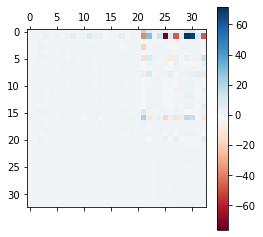

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.019710,0.003269,2.859036,0.202663,-0.290369,-0.237665,0.046581,-0.949120,0.418787,-0.364291,...,1.138157,1.809422,-12.067606,-4.312948,-5.332508,0.730126,11.026360,8.795864,-1.482903,0.238548
test coresp,-4.393520,0.858558,-0.251227,2.920625,-4.299431,1.431783,-3.656207,1.397794,4.203370,0.740133,...,0.254742,12.506773,-76.471401,9.138328,-47.848358,8.096416,71.890624,67.573402,9.608798,-47.590786
Tasa de positividad (%),0.013165,0.000405,0.991874,-0.008604,0.002871,-0.009631,0.008014,-0.023454,-0.002406,0.006563,...,0.006438,-0.031449,0.198827,-0.030981,0.031681,0.022113,-0.122404,-0.111961,0.033309,-0.018753
Asintomáticos,0.029568,-0.001037,2.114023,0.949299,-0.073041,-0.070013,0.227737,-0.345559,0.357887,-0.264549,...,0.106205,0.066283,-0.451656,-0.885390,-0.884087,0.394158,1.022823,0.792514,0.315304,-0.555788
Asintomáticos (%),0.019154,0.000949,0.454984,0.007504,0.812708,0.011782,0.107771,-0.034027,-0.015933,-0.060172,...,-0.317387,-0.119767,1.127176,1.415898,-0.375689,0.298365,-0.618842,-0.186224,0.880485,-2.074590
Zaragoza,0.132762,0.003090,1.326248,0.112333,0.123198,0.629693,0.146073,-0.568645,0.352268,-0.324337,...,1.516925,0.620297,-6.096734,-8.864090,2.943936,-1.927278,3.341009,0.438659,-5.704681,13.732012
Zaragoza (%),-0.012156,-0.000353,-0.299582,-0.011212,0.068568,-0.002441,0.900105,0.027117,0.030446,-0.000521,...,0.239163,-0.304914,1.502541,-2.190548,2.499458,-0.769699,-1.942446,-2.334862,-1.402164,4.734359
1 a 14 años,-0.033714,0.000104,0.419089,0.059517,-0.048723,-0.034928,0.044922,0.828729,0.077675,0.035742,...,0.154581,0.133038,-0.860751,-1.112389,0.077344,-0.080121,0.637633,0.333495,-0.532148,1.332298
15 a 24 años,0.033235,0.004624,1.161059,0.061260,-0.409698,-0.033102,0.024343,-0.253802,0.956920,-0.130083,...,-0.696507,-0.033487,1.218349,4.963174,-4.149952,1.861127,1.215462,2.392262,4.214376,-10.851881
25 a 34 años,-0.002808,0.000851,0.562922,0.021677,-0.000235,-0.022356,0.011656,-0.123407,0.092993,0.837244,...,0.085016,0.173925,-1.209156,-0.181167,-0.543396,0.033482,1.022727,0.871554,-0.129253,-0.147584


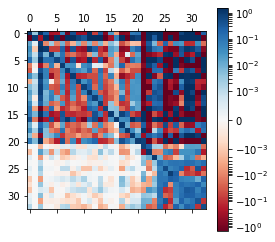

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(33, 416) = (33, 33)·(33, 33)·(33, 416)
CPU times: user 51.5 ms, sys: 31.7 ms, total: 83.2 ms
Wall time: 13 ms


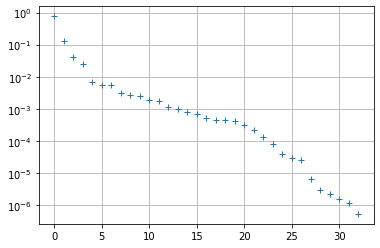

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.116331,0.248434,-0.160830,-0.672601,-0.087598,0.036502,-0.046169,0.038513,-0.403917,0.131947,...,-0.048146,-0.007723,-0.001437,-0.007633,-0.005671,-0.002301,-0.001603,-0.000011,-0.000315,-0.000032
test coresp,-0.886740,0.334572,-0.090492,0.302821,-0.002437,-0.018695,0.003026,-0.014511,-0.011138,-0.028829,...,-0.004248,0.000297,0.000843,-0.000158,-0.000047,0.000036,-0.000025,-0.000011,0.000010,0.000029
Tasa de positividad (%),-0.003454,0.000845,-0.001174,-0.023914,0.013595,0.004607,0.014454,-0.018075,-0.023487,0.016150,...,-0.939313,0.025510,0.213895,-0.001234,-0.026877,-0.014876,-0.006053,0.006194,0.004767,0.006523
Asintomáticos,-0.058838,0.132601,-0.104431,-0.335161,-0.111559,-0.207720,-0.357265,0.196176,0.732402,-0.028807,...,-0.020653,0.003661,0.004087,0.000033,-0.000212,-0.000722,0.000407,0.000189,0.000301,-0.000029
Asintomáticos (%),-0.014809,-0.026285,-0.003196,0.013835,-0.093722,-0.053042,-0.092673,0.352831,0.116335,0.040064,...,0.015116,-0.030328,0.003175,-0.016569,0.000407,0.005073,-0.000640,-0.000025,-0.000927,0.000640
Zaragoza,-0.081457,0.158838,-0.108318,-0.417686,0.030314,0.215136,0.303430,-0.242232,0.148001,-0.061990,...,0.059412,0.025363,0.001108,0.013832,0.005091,-0.000578,0.000931,0.000090,-0.000177,0.000177
Zaragoza (%),-0.021207,-0.042501,0.004069,0.033097,-0.040355,0.185013,0.144154,0.105451,0.156634,0.227270,...,-0.152574,-0.048737,0.005269,-0.024163,-0.008213,-0.003461,0.000142,0.000508,-0.000045,0.000013
1 a 14 años,-0.014097,0.023507,-0.027038,-0.041653,-0.059793,-0.320106,-0.041131,-0.322581,0.010944,0.548909,...,0.087739,-0.017619,-0.017285,-0.002452,-0.003962,-0.002885,0.000458,0.000892,0.000931,-0.000594
15 a 24 años,-0.017806,0.036923,-0.185843,-0.136302,0.810231,0.038478,0.026875,0.290954,-0.094909,-0.076755,...,0.061014,-0.017153,0.007253,-0.009162,0.007860,0.002606,0.001405,-0.000138,0.000234,0.000019
25 a 34 años,-0.014352,0.031634,-0.064820,-0.089689,0.131014,-0.043540,-0.024802,-0.037606,0.105966,0.116231,...,0.047219,-0.016202,-0.035159,0.012808,0.003800,0.002483,0.002033,0.001010,-0.000719,-0.000388


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

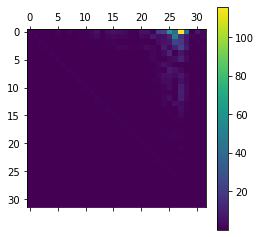

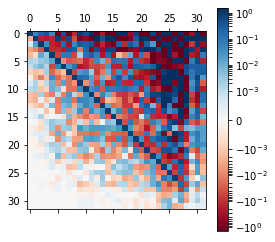

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

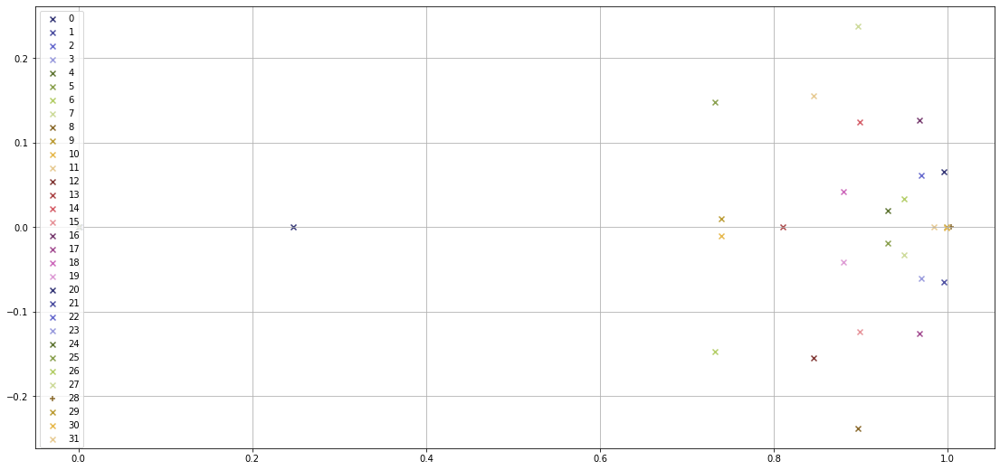

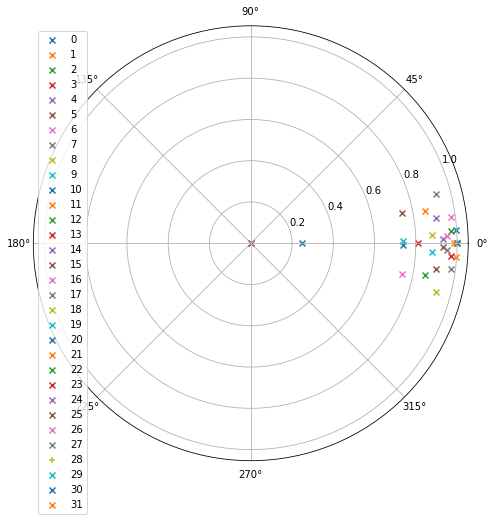

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-27,4.0,54.571429,1657.571429,0.0,3.791429,36.341429,35.714286,7.571429,2.285714,6.428571,...,38.574209,87.641058,88.810329,81.176057,86.041046,88.931339,88.501498,89.117481,91.077461,88.832541
2021-10-28,4.0,62.142857,1710.571429,0.0,4.108571,40.401429,39.142857,9.571429,2.714286,8.571429,...,38.532792,87.636348,88.805142,81.173865,86.034998,88.926211,88.496163,89.112956,91.073022,88.829027
2021-10-29,4.0,70.000000,1856.714286,0.0,3.898571,49.012857,43.857143,9.857143,2.571429,11.571429,...,38.491375,87.631042,88.799801,81.171790,86.026832,88.920727,88.489996,89.107786,91.068478,88.824848
2021-10-30,4.0,73.857143,1889.714286,0.0,4.158571,50.758571,46.571429,10.285714,2.857143,11.857143,...,38.453219,87.625444,88.794227,81.169483,86.018465,88.915385,88.483690,89.102292,91.063088,88.819910
2021-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-10-27,65.829902,1886.515770,3.669876,39.666705,68.392654,39.733921,67.147700,8.292307,8.870903,6.322835,...,38.737083,87.648312,88.722987,81.203529,86.020725,88.941639,88.572480,89.166074,91.077671,88.767609
2021-10-28,57.450062,1823.173678,3.448360,36.898872,68.188967,33.085394,67.597084,9.116089,5.539637,5.674378,...,38.663043,87.646770,88.728566,81.199961,86.018008,88.935277,88.556894,89.156827,91.068595,88.782269
2021-10-29,59.826190,1806.168107,3.556001,39.444608,69.559722,32.732140,64.852175,8.806935,4.512748,7.097608,...,38.619280,87.642891,88.724340,81.198473,86.008113,88.928297,88.546959,89.153544,91.063384,88.778831
2021-10-30,57.437003,1769.398756,3.465319,38.402169,68.610840,29.821885,64.111275,7.704581,4.523165,7.695569,...,38.577034,87.638770,88.723198,81.195414,86.002927,88.922875,88.540612,89.146944,91.057433,88.778772
2021-10-31,66.907887,1828.092694,3.866955,43.093526,68.013472,34.602177,62.596154,9.413432,7.056336,9.667661,...,38.534210,87.633876,88.718556,81.192293,85.991991,88.915798,88.536288,89.143670,91.052488,88.774505


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,...,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000,416.000000
mean,1.047132,2.760543,1.433732,6.124617,4.048161,-4.284990,-4.355409,-3.148356,35.116479,4.829472,...,0.183219,0.005869,-0.087074,0.026714,-0.022107,-0.010389,0.081543,0.056740,-0.018334,-0.078253
std,5.082973,3.854558,4.040245,9.466483,4.222182,5.939798,2.076255,6.765491,43.695555,8.974984,...,0.207782,0.008632,0.022041,0.015429,0.018987,0.014289,0.042877,0.025027,0.010000,0.048091
min,-12.183292,-8.204459,-15.656351,-14.051867,-6.646268,-26.362968,-11.581426,-23.566101,-12.881611,-16.452315,...,-0.036794,-0.014307,-0.138093,-0.003850,-0.065367,-0.043914,0.019253,0.005595,-0.047721,-0.179072
25%,-2.177093,0.312922,-1.014501,0.410255,1.075951,-7.398351,-5.642562,-6.793086,9.378938,-0.391568,...,0.011325,0.000899,-0.102319,0.014134,-0.034794,-0.019048,0.045484,0.038941,-0.024303,-0.125966
50%,0.392761,2.141460,1.435481,4.095138,3.509488,-3.806298,-4.221288,-3.235734,22.275212,2.901259,...,0.090370,0.005776,-0.087130,0.027009,-0.023876,-0.011600,0.067251,0.051397,-0.017704,-0.069790
75%,3.513411,4.947212,4.274882,9.869052,6.781875,-0.302740,-3.197500,1.137785,40.628279,7.449272,...,0.328201,0.010432,-0.069768,0.036786,-0.009397,-0.002307,0.125213,0.081077,-0.012056,-0.039844
max,30.472028,26.922409,15.351741,54.406524,21.302566,13.073055,6.763233,27.284402,291.166913,42.826438,...,0.771305,0.127022,0.009316,0.136580,0.123927,0.093558,0.204713,0.150745,0.070607,0.144150


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                          63.428571
test coresp                  1744.857143
Tasa de positividad (%)         3.987143
Asintomáticos                  41.528571
Asintomáticos (%)              67.857143
Zaragoza                       49.142857
Zaragoza (%)                   78.646374
1 a 14 años                    11.285714
15 a 24 años                    3.285714
25 a 34 años                    6.285714
35 a 44 años                   12.571429
45 a 54 años                   11.428571
55 a 64 años                    8.000000
65 a 74 años                    4.714286
75 años o más                   5.285714
Camas Ocup                     66.571429
Camas libres                 1282.571429
Camas (%)                       5.203240
UCI ocupadas                   13.571429
UCI libres con resp            91.857143
UCI (%)                        14.880732
Rs                              1.035496
Rd                              1.689190
Inoculados                     39.052044
Total Casos     

Casos                          67.285714
test coresp                  1775.142857
Tasa de positividad (%)         4.128571
Asintomáticos                  43.765714
Asintomáticos (%)              67.714286
Zaragoza                       50.714286
Zaragoza (%)                   76.882705
1 a 14 años                    11.857143
15 a 24 años                    3.857143
25 a 34 años                    6.428571
35 a 44 años                   13.000000
45 a 54 años                   12.571429
55 a 64 años                    7.714286
65 a 74 años                    5.285714
75 años o más                   5.857143
Camas Ocup                     66.857143
Camas libres                 1267.285714
Camas (%)                       5.294116
UCI ocupadas                   13.714286
UCI libres con resp            89.714286
UCI (%)                        15.510068
Rs                              1.173884
Rd                              1.781026
Inoculados                     38.977951
Total Casos     

Casos                          73.390709
test coresp                  1855.783664
Tasa de positividad (%)         3.976777
Asintomáticos                  48.302460
Asintomáticos (%)              69.064887
Zaragoza                       50.956063
Zaragoza (%)                   75.459527
1 a 14 años                    10.294740
15 a 24 años                   12.760059
25 a 34 años                    7.726931
35 a 44 años                   12.479494
45 a 54 años                   11.060513
55 a 64 años                    8.987911
65 a 74 años                    5.670975
75 años o más                   4.891734
Camas Ocup                     64.556345
Camas libres                 1276.878699
Camas (%)                       4.855195
UCI ocupadas                   13.361551
UCI libres con resp            92.985090
UCI (%)                        11.824271
Rs                              1.195513
Rd                              1.836435
Inoculados                     39.047305
Total Casos     

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-10-24,0.0,0.0,0.0,0.0,1.870,23.0,0.0
2021-10-25,0.0,0.0,0.0,0.0,0.692,68.0,0.0
2021-10-26,0.0,0.0,0.0,0.0,1.758,66.0,0.0
2021-10-27,0.0,0.0,0.0,0.0,2.614,77.0,0.0
2021-10-28,0.0,0.0,0.0,0.0,2.437,51.0,0.0
2021-10-29,0.0,0.0,0.0,0.0,0.000,111.0,7.0
2021-10-30,0.0,0.0,0.0,0.0,0.000,94.0,0.0
2021-10-31,0.0,0.0,0.0,0.0,1.132,50.0,0.0
2021-11-01,0.0,0.0,0.0,NaN,0.000,23.0,1.0
2021-11-02,0.0,0.0,0.0,NaN,0.110,105.0,1.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-10-30,0.0,0.000000,0.285714,0.714286,0.000000,1.000000,0.0,1.0,1.338714
2021-10-31,0.0,0.000000,0.285714,0.714286,0.000000,1.000000,0.0,1.0,1.233286
2021-11-01,0.0,0.142857,0.285714,0.714286,0.000000,1.000000,1.0,1.0,1.134429
2021-11-02,0.0,0.142857,0.285714,0.714286,-0.142857,1.142857,1.0,1.0,0.899000
2021-11-03,0.0,0.142857,0.285714,0.714286,-0.285714,1.285714,1.0,1.0,0.791000
2021-11-04,0.0,0.142857,0.285714,0.714286,-0.428571,1.428571,1.0,1.0,0.822000
2021-11-05,0.0,0.142857,0.285714,0.714286,0.428571,0.571429,1.0,1.0,0.822000
2021-11-06,0.0,0.142857,0.285714,0.714286,0.428571,0.571429,1.0,1.0,0.822000
2021-11-07,0.0,0.142857,0.285714,0.714286,0.428571,0.571429,1.0,1.0,0.768000
2021-11-08,0.0,0.000000,0.285714,0.714286,0.285714,0.714286,0.0,1.0,0.815571


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-10-30,0.0,0.000000,0.285714,0.714286,0.000000,1.000000,0.0,1.0,1.338714
2021-10-31,0.0,0.000000,0.285714,0.714286,0.000000,1.000000,0.0,1.0,1.233286
2021-11-01,0.0,0.142857,0.285714,0.714286,0.000000,1.000000,1.0,1.0,1.134429
2021-11-02,0.0,0.142857,0.285714,0.714286,-0.142857,1.142857,1.0,1.0,0.899000
2021-11-03,0.0,0.142857,0.285714,0.714286,-0.285714,1.285714,1.0,1.0,0.791000
2021-11-04,0.0,0.142857,0.285714,0.714286,-0.428571,1.428571,1.0,1.0,0.822000
2021-11-05,0.0,0.142857,0.285714,0.714286,0.428571,0.571429,1.0,1.0,0.822000
2021-11-06,0.0,0.142857,0.285714,0.714286,0.428571,0.571429,1.0,1.0,0.822000
2021-11-07,0.0,0.142857,0.285714,0.714286,0.428571,0.571429,1.0,1.0,0.768000
2021-11-08,0.0,0.000000,0.285714,0.714286,0.285714,0.714286,0.0,1.0,0.815571


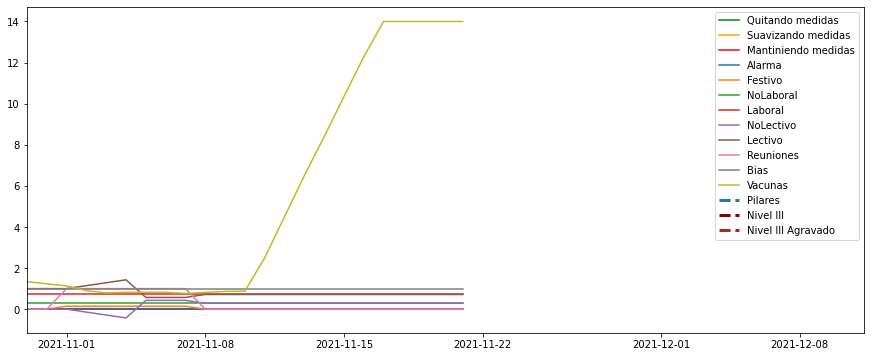

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
#U1.loc['2021-10-12','Festivo']=1
U1.loc['2021-11-1','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
#U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
#U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
#U1.loc['2021-10-9':'2021-10-13','Reuniones']=7
#U1.loc['2021-10-15':'2021-10-16','Reuniones']=7
#U1.loc['2021-10-29':'2021-10-30','Reuniones']=7
U1.loc['2021-11-1','Reuniones']=7

U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
#U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
#U1.loc['2021-10-9':'2021-10-13','Lectivo']=0
U1.loc['2021-11-1','Lectivo']=0
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 0 ns, sys: 1 µs, total: 1 µs
Wall time: 3.1 µs


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-30,73.857143,1889.714286,4.158574,50.758571,67.428572,46.571429,64.128041,10.285713,2.857142,11.857143,...,38.453212,87.627369,88.794027,81.169234,86.018312,88.915251,88.483561,89.101573,91.063043,88.819617
2021-10-31,81.346332,1999.478036,4.192691,55.217432,67.406622,49.231787,63.766866,10.935974,9.276719,12.471729,...,38.445861,87.618049,88.777360,81.161413,86.010711,88.915842,88.489437,89.093807,91.056367,88.793873
2021-11-01,91.519182,2108.941927,4.257867,59.545725,67.305050,54.560341,63.437712,11.631468,17.391162,13.452257,...,38.440249,87.610012,88.765461,81.146315,86.000722,88.908956,88.488078,89.089733,91.049807,88.776131
2021-11-02,101.041947,2194.378902,4.388104,62.377893,67.063463,62.964033,64.211410,12.267537,25.333044,14.469176,...,38.431217,87.599464,88.768138,81.115095,86.009160,88.897207,88.473450,89.070730,91.038965,88.783525
2021-11-03,111.975688,2294.594689,4.471181,65.954219,66.891871,72.930005,65.115869,13.059743,33.673470,15.907506,...,38.423724,87.589822,88.761074,81.084090,86.005711,88.890036,88.466198,89.061813,91.032069,88.778701
2021-11-04,124.032276,2410.875853,4.489798,69.991327,66.803082,83.740905,65.977869,13.995055,42.272909,17.731002,...,38.418424,87.579605,88.750899,81.047754,85.999042,88.883343,88.461506,89.055448,91.026071,88.770202
2021-11-05,136.782260,2541.195187,4.438759,74.167862,66.752663,94.998465,66.772967,15.074250,50.814163,19.875810,...,38.415603,87.568372,88.739002,81.004915,85.990617,88.876665,88.457646,89.049567,91.020251,88.760641
2021-11-06,148.268826,2575.544070,4.540976,76.182883,66.758641,107.678734,68.135997,15.697896,57.679383,21.434765,...,38.407993,87.557583,88.732928,80.955523,85.984566,88.867282,88.457521,89.043876,91.008917,88.751256
2021-11-07,158.239370,2613.639772,4.553938,78.588487,66.893900,118.783882,69.389709,16.484763,62.511691,23.119212,...,38.401352,87.544982,88.722812,80.903058,85.975271,88.860256,88.452750,89.035471,91.001128,88.744956
2021-11-08,166.226849,2651.288415,4.482287,80.998220,67.126718,127.955304,70.549862,17.447661,65.105450,24.782350,...,38.395203,87.531345,88.712027,80.848525,85.963876,88.852689,88.446947,89.026310,90.992876,88.738986


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-30,73.857143,1889.714286,4.158574,50.758571,67.428572,46.571429,64.128041,10.285713,2.857142,11.857143,...,38.453212,87.627369,88.794027,81.169234,86.018312,88.915251,88.483561,89.101573,91.063043,88.819617
2021-10-31,81.960637,2001.855270,4.198207,54.445993,67.027947,49.387974,63.625256,10.978300,9.611980,12.519058,...,38.412816,87.616566,88.780974,81.158923,86.007109,88.913276,88.479599,89.088771,91.056342,88.804206
2021-11-01,92.512741,2110.880072,4.279872,58.084279,66.604412,54.960648,63.258556,11.676296,17.989586,13.509001,...,38.376068,87.607175,88.769327,81.141854,85.996882,88.905082,88.475938,89.082515,91.049305,88.786933
2021-11-02,102.289190,2194.673995,4.432051,60.355562,66.123926,63.537787,64.012332,12.279668,26.220804,14.522925,...,38.338056,87.595601,88.771508,81.109217,86.004182,88.892397,88.460105,89.062646,91.038392,88.793368
2021-11-03,113.379476,2292.469411,4.540291,63.607171,65.828526,73.614129,64.910334,13.016756,34.857239,15.961781,...,38.307209,87.585241,88.763427,81.077043,85.999877,88.884814,88.453136,89.053837,91.031526,88.786090
2021-11-04,125.646711,2406.483863,4.585802,67.500461,65.679966,84.529862,65.754040,13.898370,43.791679,17.811965,...,38.281169,87.574417,88.752537,81.039350,85.992153,88.877818,88.448391,89.047585,91.025633,88.775872
2021-11-05,138.774478,2535.169038,4.563659,71.643398,65.579827,95.965847,66.513215,14.942334,52.724741,20.021685,...,38.256806,87.562490,88.740431,80.994632,85.982509,88.870701,88.443592,89.041335,91.019895,88.765808
2021-11-06,150.806974,2568.442533,4.697225,73.760820,65.548172,108.940346,67.839544,15.552273,60.016266,21.682065,...,38.227570,87.550952,88.734207,80.942952,85.975393,88.860878,88.442583,89.035202,91.008599,88.755934
2021-11-07,161.507947,2606.175019,4.743752,76.412479,65.656200,120.468787,69.057405,16.348948,65.308180,23.504013,...,38.199219,87.537559,88.723974,80.887827,85.964973,88.853385,88.436905,89.026338,91.000856,88.749223
2021-11-08,170.397058,2644.208650,4.707390,79.247200,65.886386,130.194704,70.189027,17.344681,68.381006,25.337805,...,38.172603,87.523134,88.712939,80.830345,85.952507,88.845412,88.430571,89.016904,90.992656,88.742484


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-30,73.857143,1889.714286,4.158574,50.758571,67.428572,46.571429,64.128041,10.285713,2.857142,11.857143,...,38.453212,87.627369,88.794027,81.169234,86.018312,88.915251,88.483561,89.101573,91.063043,88.819617
2021-10-31,81.960637,2001.855270,4.198207,54.445993,67.027947,49.387974,63.625256,10.978300,9.611980,12.519058,...,38.412816,87.616566,88.780974,81.158923,86.007109,88.913276,88.479599,89.088771,91.056342,88.804206
2021-11-01,92.512741,2110.880072,4.279872,58.084279,66.604412,54.960648,63.258556,11.676296,17.989586,13.509001,...,38.376068,87.607175,88.769327,81.141854,85.996882,88.905082,88.475938,89.082515,91.049305,88.786933
2021-11-02,102.289190,2194.673995,4.432051,60.355562,66.123926,63.537787,64.012332,12.279668,26.220804,14.522925,...,38.338056,87.595601,88.771508,81.109217,86.004182,88.892397,88.460105,89.062646,91.038392,88.793368
2021-11-03,113.379476,2292.469411,4.540291,63.607171,65.828526,73.614129,64.910334,13.016756,34.857239,15.961781,...,38.307209,87.585241,88.763427,81.077043,85.999877,88.884814,88.453136,89.053837,91.031526,88.786090
2021-11-04,125.646711,2406.483863,4.585802,67.500461,65.679966,84.529862,65.754040,13.898370,43.791679,17.811965,...,38.281169,87.574417,88.752537,81.039350,85.992153,88.877818,88.448391,89.047585,91.025633,88.775872
2021-11-05,138.774478,2535.169038,4.563659,71.643398,65.579827,95.965847,66.513215,14.942334,52.724741,20.021685,...,38.256806,87.562490,88.740431,80.994632,85.982509,88.870701,88.443592,89.041335,91.019895,88.765808
2021-11-06,150.806974,2568.442533,4.697225,73.760820,65.548172,108.940346,67.839544,15.552273,60.016266,21.682065,...,38.227570,87.550952,88.734207,80.942952,85.975393,88.860878,88.442583,89.035202,91.008599,88.755934
2021-11-07,161.507947,2606.175019,4.743752,76.412479,65.656200,120.468787,69.057405,16.348948,65.308180,23.504013,...,38.199219,87.537559,88.723974,80.887827,85.964973,88.853385,88.436905,89.026338,91.000856,88.749223
2021-11-08,170.397058,2644.208650,4.707390,79.247200,65.886386,130.194704,70.189027,17.344681,68.381006,25.337805,...,38.172603,87.523134,88.712939,80.830345,85.952507,88.845412,88.430571,89.016904,90.992656,88.742484


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-10-30,73.857143,1889.714286,4.158574,50.758571,67.428572,46.571429,64.128041,10.285713,2.857142,11.857143,...,38.453212,87.627369,88.794027,81.169234,86.018312,88.915251,88.483561,89.101573,91.063043,88.819617
2021-10-31,81.960637,2001.855270,4.198207,54.445993,67.027947,49.387974,63.625256,10.978300,9.611980,12.519058,...,38.412816,87.616566,88.780974,81.158923,86.007109,88.913276,88.479599,89.088771,91.056342,88.804206
2021-11-01,92.512741,2110.880072,4.279872,58.084279,66.604412,54.960648,63.258556,11.676296,17.989586,13.509001,...,38.376068,87.607175,88.769327,81.141854,85.996882,88.905082,88.475938,89.082515,91.049305,88.786933
2021-11-02,102.289190,2194.673995,4.432051,60.355562,66.123926,63.537787,64.012332,12.279668,26.220804,14.522925,...,38.338056,87.595601,88.771508,81.109217,86.004182,88.892397,88.460105,89.062646,91.038392,88.793368
2021-11-03,113.379476,2292.469411,4.540291,63.607171,65.828526,73.614129,64.910334,13.016756,34.857239,15.961781,...,38.307209,87.585241,88.763427,81.077043,85.999877,88.884814,88.453136,89.053837,91.031526,88.786090
2021-11-04,125.646711,2406.483863,4.585802,67.500461,65.679966,84.529862,65.754040,13.898370,43.791679,17.811965,...,38.281169,87.574417,88.752537,81.039350,85.992153,88.877818,88.448391,89.047585,91.025633,88.775872
2021-11-05,138.774478,2535.169038,4.563659,71.643398,65.579827,95.965847,66.513215,14.942334,52.724741,20.021685,...,38.256806,87.562490,88.740431,80.994632,85.982509,88.870701,88.443592,89.041335,91.019895,88.765808
2021-11-06,150.806974,2568.442533,4.697225,73.760820,65.548172,108.940346,67.839544,15.552273,60.016266,21.682065,...,38.227570,87.550952,88.734207,80.942952,85.975393,88.860878,88.442583,89.035202,91.008599,88.755934
2021-11-07,161.507947,2606.175019,4.743752,76.412479,65.656200,120.468787,69.057405,16.348948,65.308180,23.504013,...,38.199219,87.537559,88.723974,80.887827,85.964973,88.853385,88.436905,89.026338,91.000856,88.749223
2021-11-08,170.397058,2644.208650,4.707390,79.247200,65.886386,130.194704,70.189027,17.344681,68.381006,25.337805,...,38.172603,87.523134,88.712939,80.830345,85.952507,88.845412,88.430571,89.016904,90.992656,88.742484


CPU times: user 79 ms, sys: 8.95 ms, total: 88 ms
Wall time: 87.8 ms


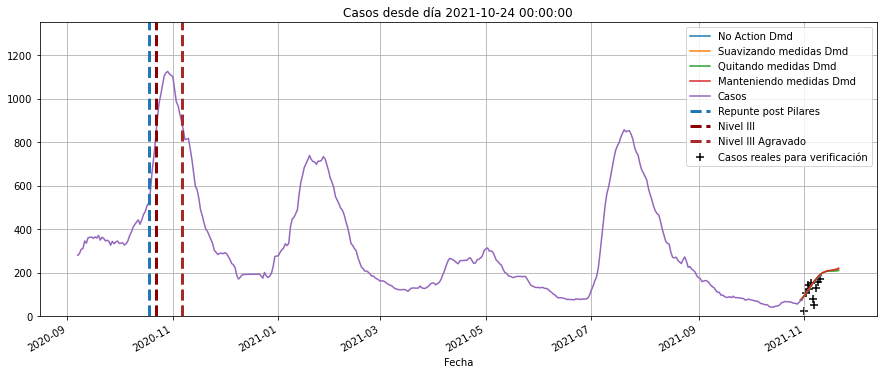

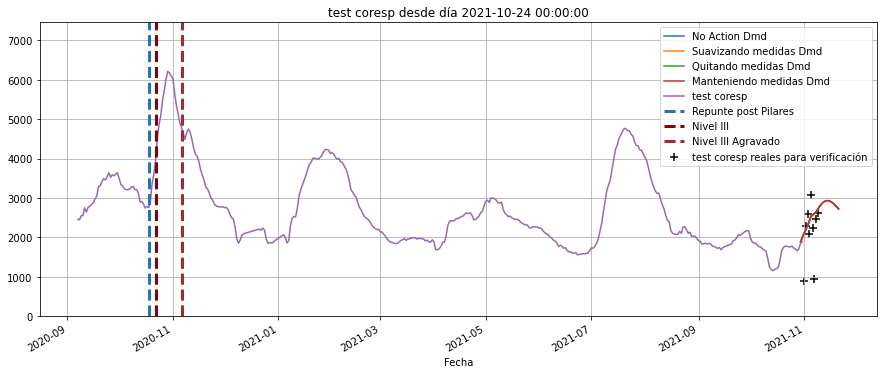

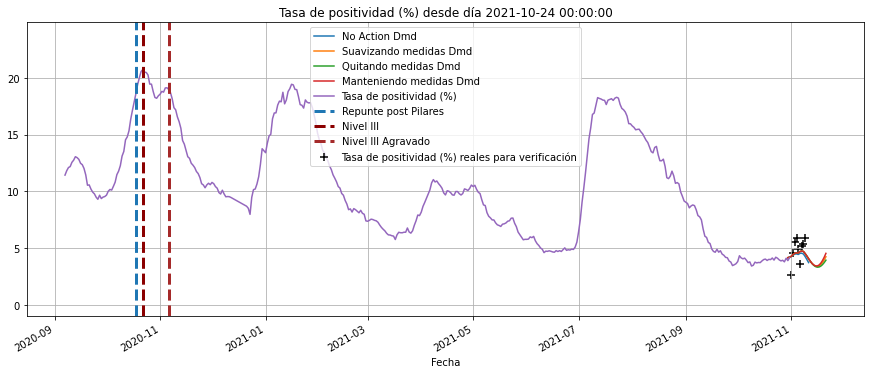

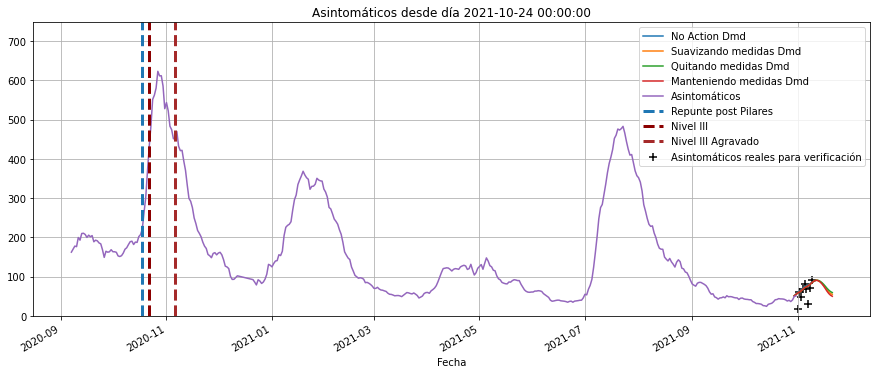

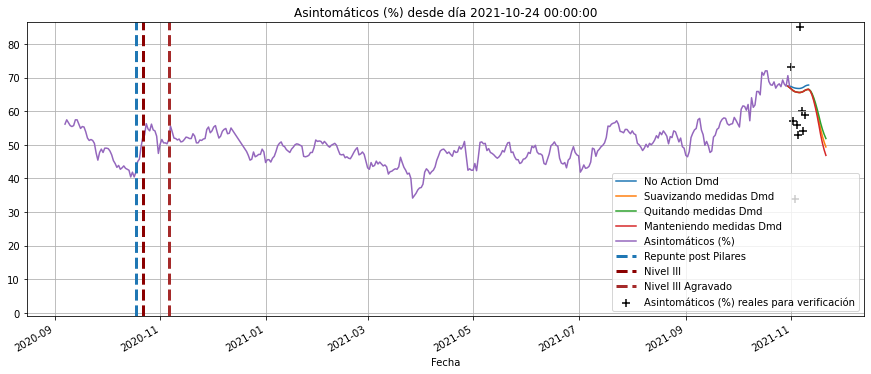

...

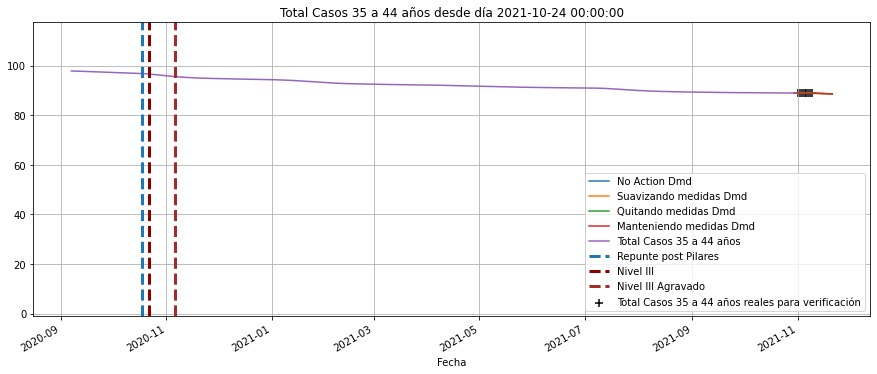

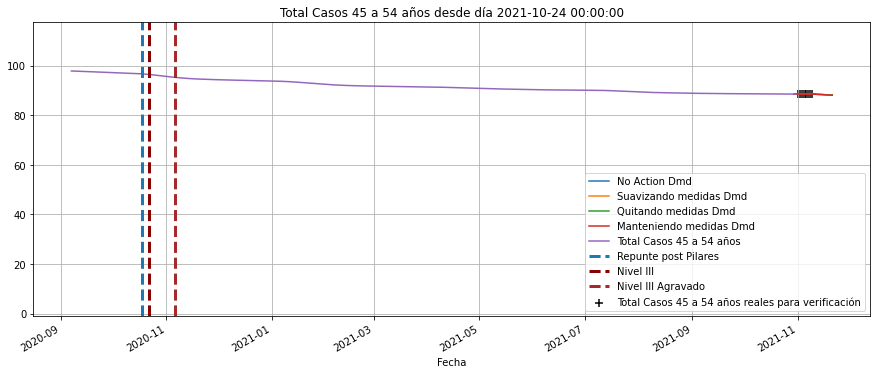

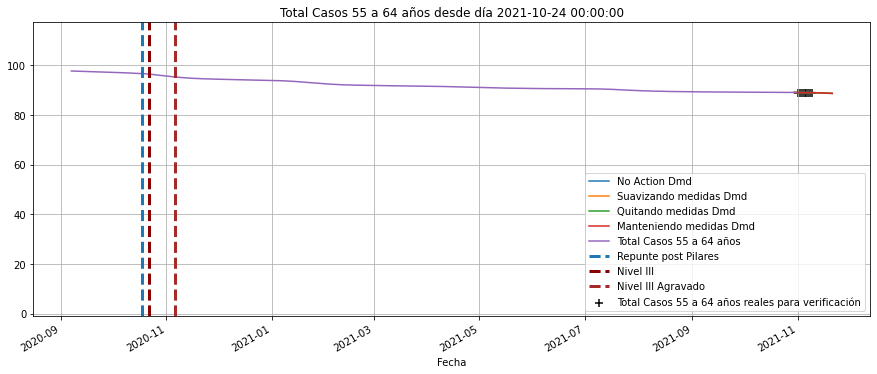

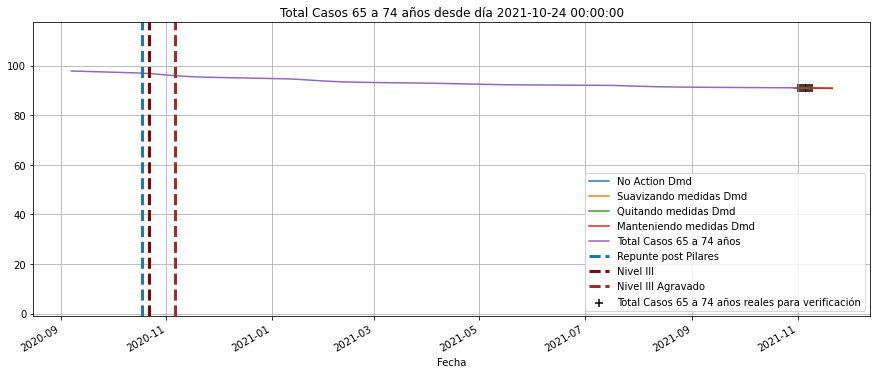

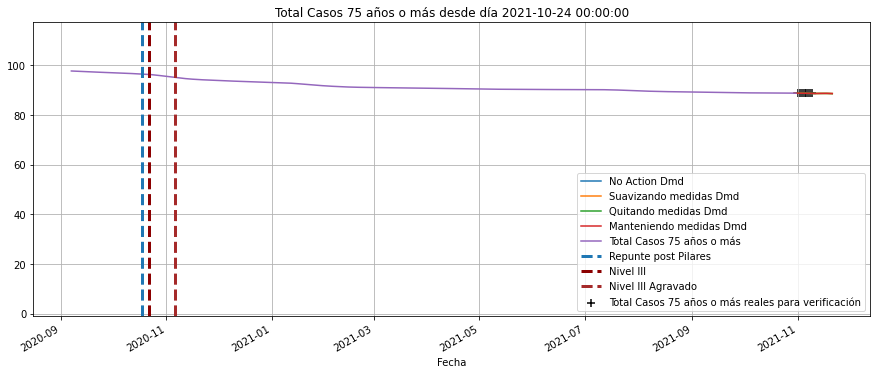

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

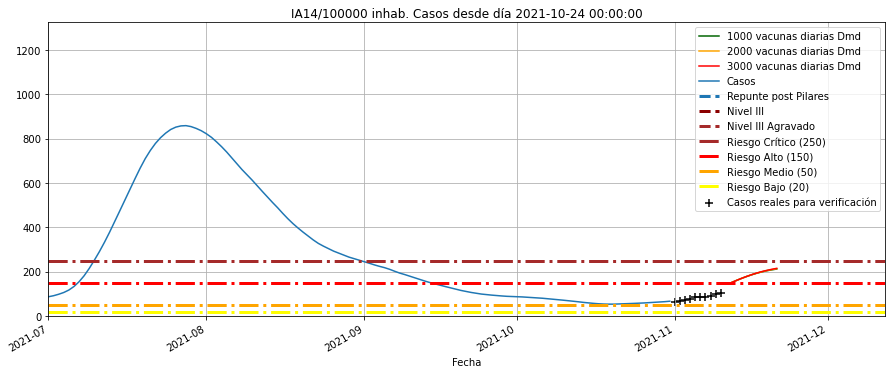

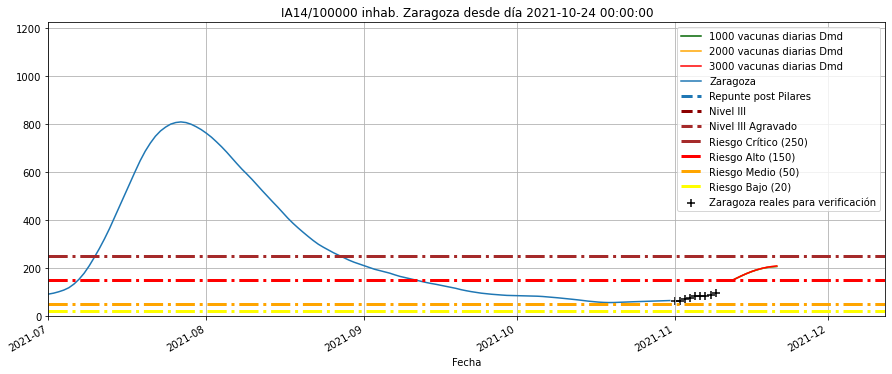

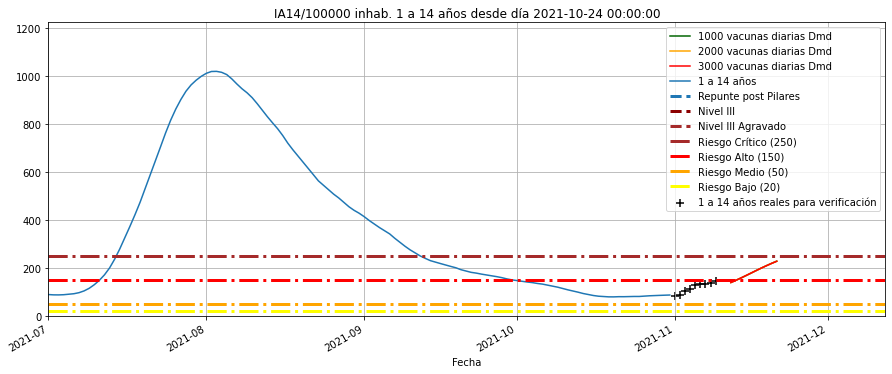

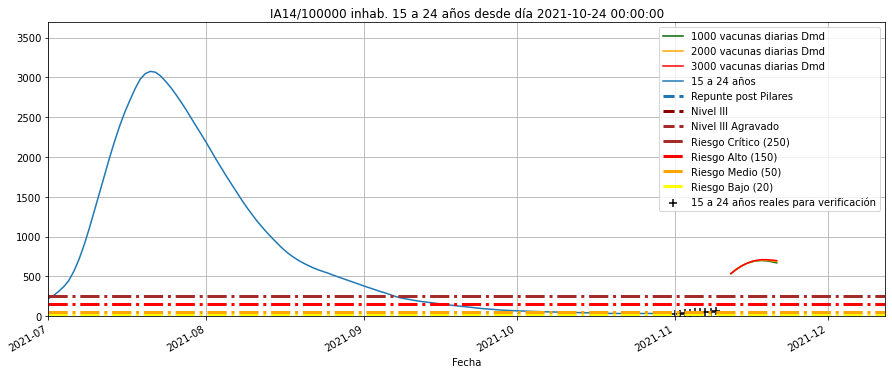

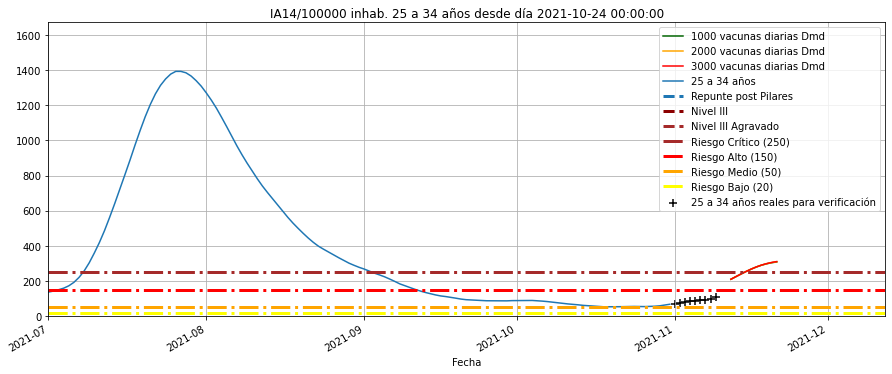

...

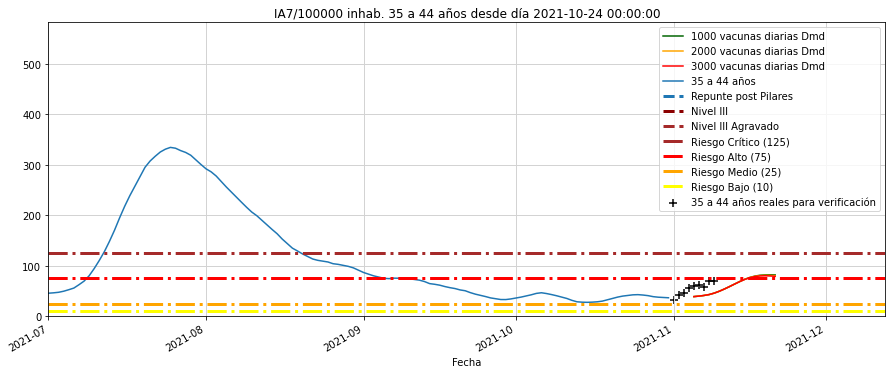

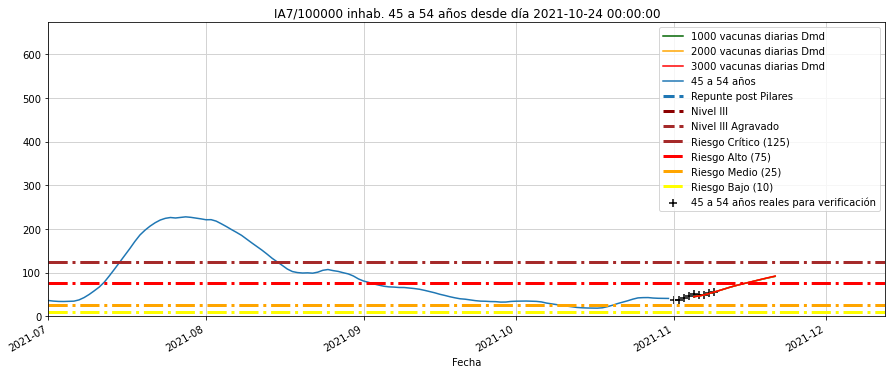

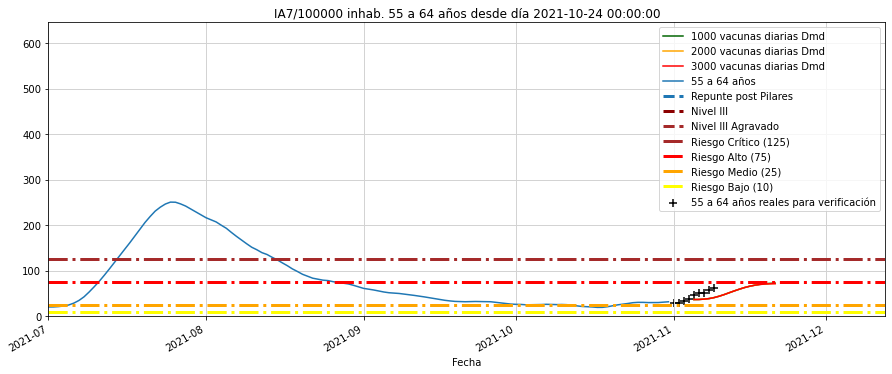

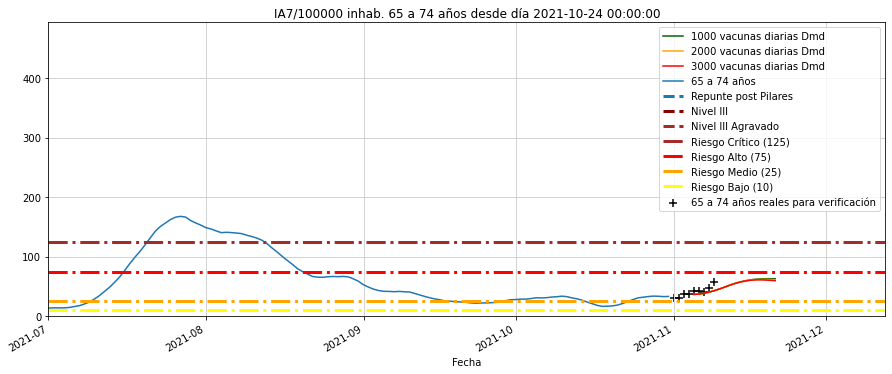

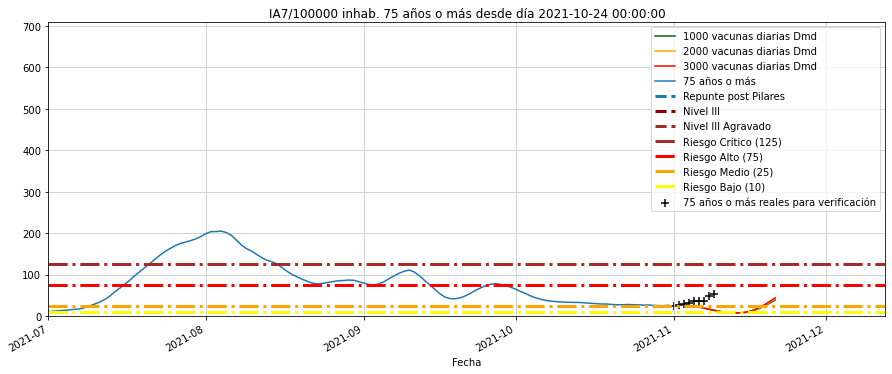

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-11-07,7,49.0,937.0,0.0,5.23,29.40,34.0,7.0,4.0,6.0,...,38.193688,87.557019,88.702185,81.131194,85.937516,88.842238,88.416409,89.034750,91.006022,88.766630
2021-11-08,1,131.0,2461.0,0.0,5.32,70.74,72.0,15.0,11.0,13.0,...,38.183386,87.547090,88.694057,81.122314,85.928342,88.827780,88.409133,89.027398,90.994925,88.753334
2021-11-09,2,155.0,2626.0,0.0,5.90,91.45,108.0,23.0,14.0,19.0,...,38.169216,87.535341,88.681593,81.111012,85.914935,88.814319,88.398947,89.017784,90.980870,88.743362
2021-11-10,3,171.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,38.109475,87.522379,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-11,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

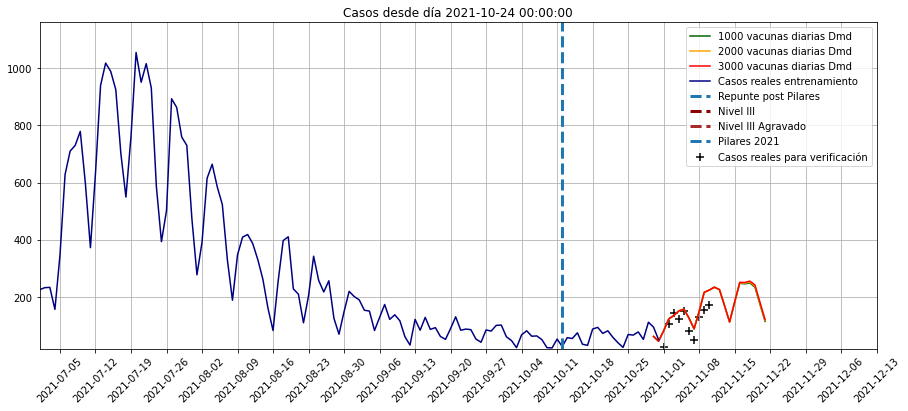

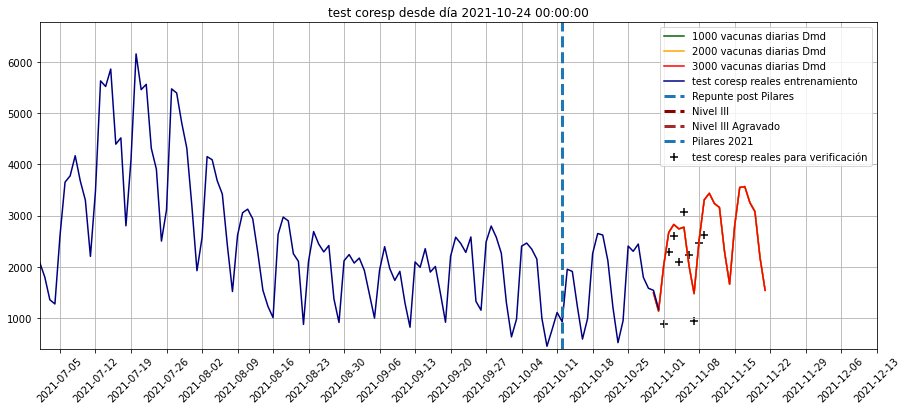

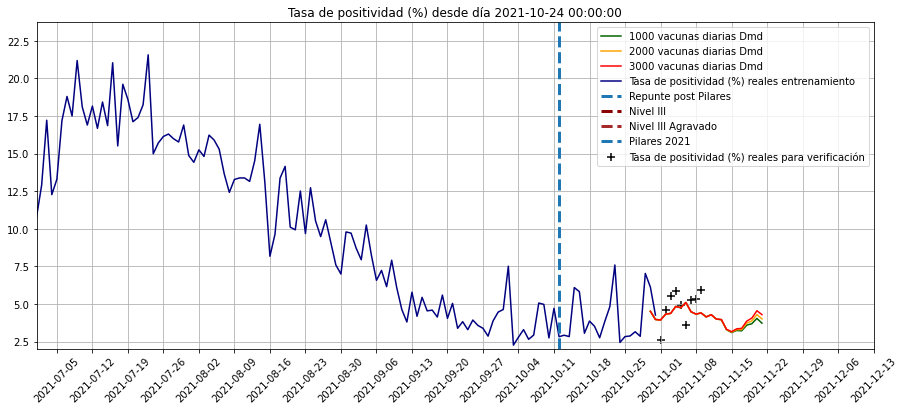

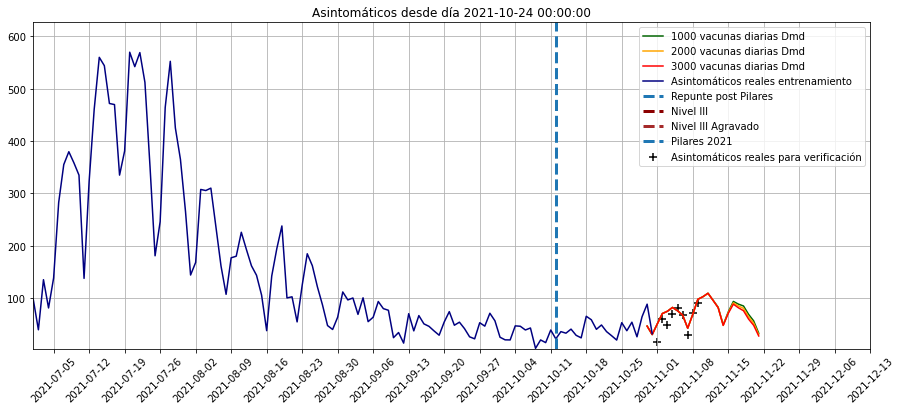

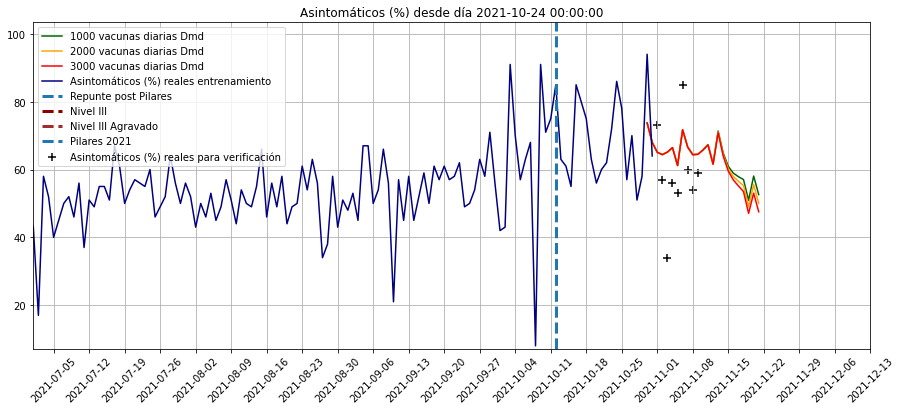

...

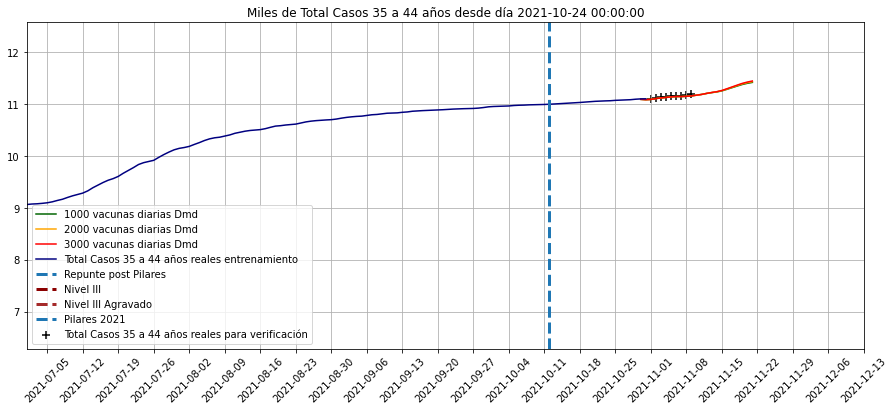

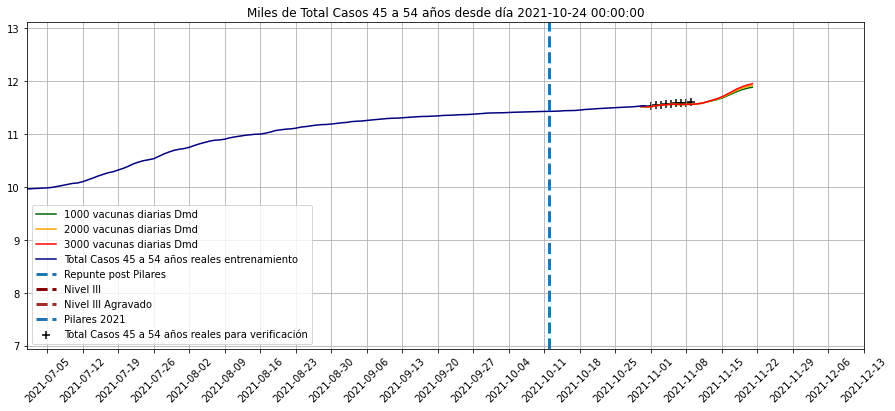

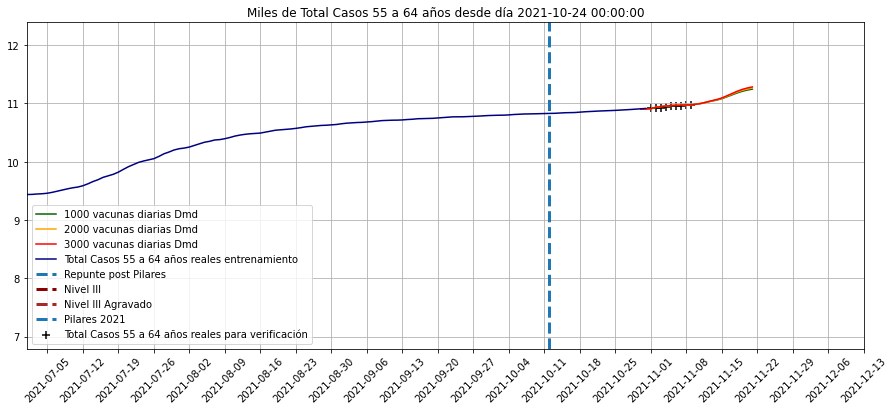

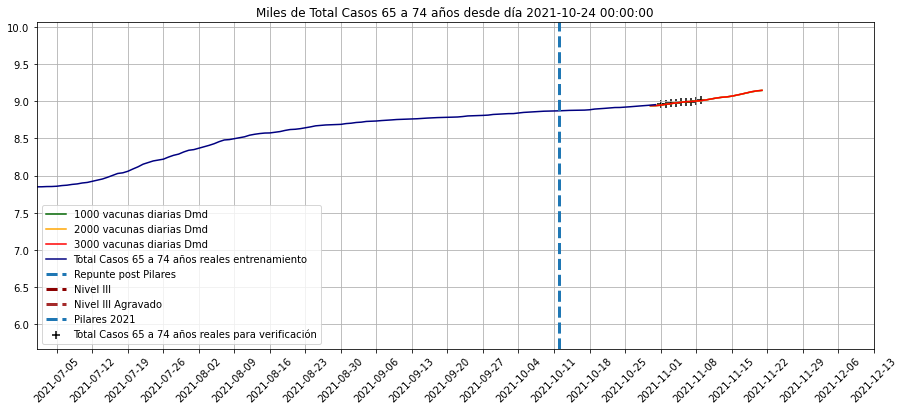

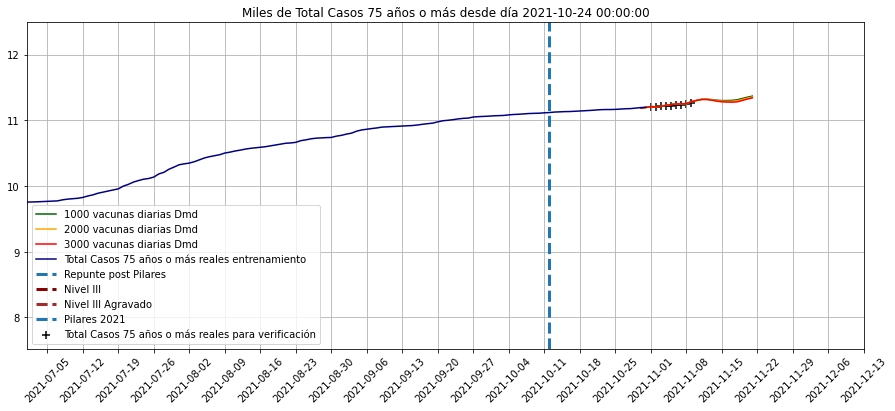

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index
kControl2.loc['Nº de pacientes a los que se ha realizado pruebas']=0

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-11-10':'2021-11-14'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas',
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-11-10':'2021-11-14'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-11-14,112,1658,0,3,64,80,13,77,75,1058,12,30,18,13,13,10,7,2
2021-11-13,169,2296,0,4,71,129,14,70,72,1077,23,53,27,18,19,14,10,2
2021-11-12,225,3158,0,4,62,168,13,69,69,1067,27,79,38,25,25,17,13,1
2021-11-11,234,3237,0,4,67,176,13,69,69,974,27,89,37,23,25,19,14,1
2021-11-10,224,3436,0,4,66,171,13,71,67,950,25,90,35,22,24,17,13,1


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más,Nº de pacientes a los que se ha realizado pruebas
2021-10-30,61.431530,1486.904230,4.513393,46.480666,73.770591,40.649123,67.191421,9.278103,2.305438,9.632113,...,87.627369,88.787529,81.159392,86.012409,88.911314,88.479325,89.098035,91.059670,88.815625,0.0
2021-10-31,44.525798,1131.607275,3.967225,30.224144,67.998203,26.575890,63.179384,4.990644,4.699818,6.577685,...,87.616566,88.784518,81.165440,86.012078,88.917468,88.484099,89.092842,91.058753,88.805958,0.0
2021-11-01,80.946112,2014.886444,3.930160,50.573962,65.078698,44.068868,58.063795,8.807397,14.938843,11.696992,...,87.607175,88.778333,81.156674,86.006306,88.912683,88.483195,89.089393,91.053668,88.791907,0.0
2021-11-02,122.345620,2669.495913,4.317157,70.428630,64.391984,76.397614,64.119509,15.420521,30.465546,17.136384,...,87.595601,88.776408,81.118519,86.009013,88.895622,88.463631,89.065404,91.041139,88.796603,0.0
2021-11-03,134.511233,2825.932982,4.372448,74.829200,65.141757,88.528994,65.808838,15.819281,43.931980,18.965335,...,87.585241,88.764008,81.077947,86.000186,88.883961,88.452685,89.052887,91.032107,88.787653,0.0


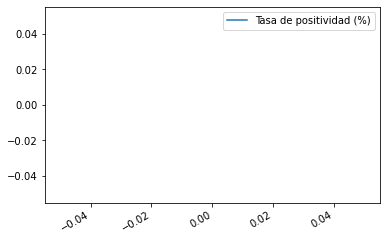

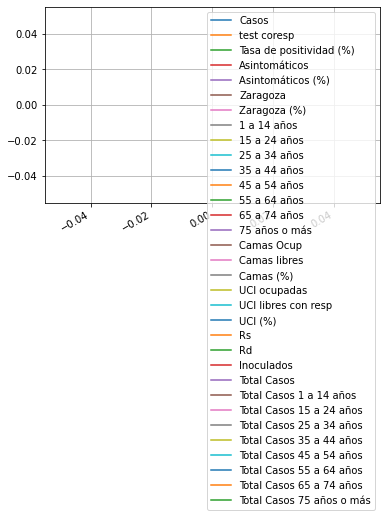

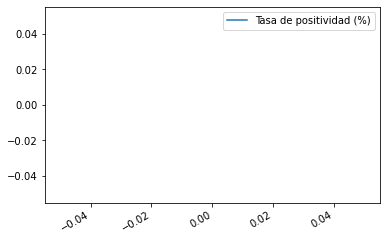

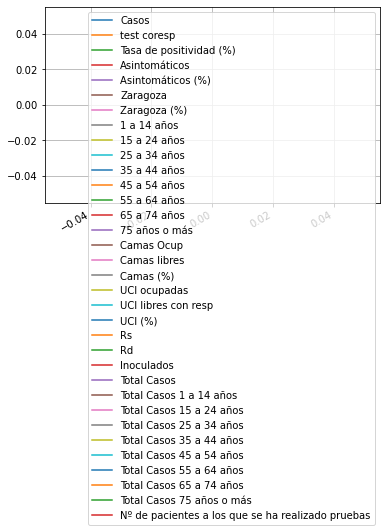

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-10-27     3.151862
2021-10-28     2.845982
2021-10-29     7.034221
2021-10-30     6.115810
2021-10-31     4.262575
Length: 396, dtype: float64

<AxesSubplot:xlabel='Fecha'>

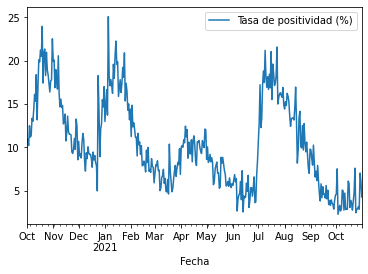

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,9.0,17.180528,123.096180,-58.370312,-26.164532,-18.839362,2.240367,340.369862
15 a 24 años,9.0,inf,NaN,370.736937,451.724701,632.199661,1110.683327,inf
25 a 34 años,9.0,82.310164,51.524783,14.242563,33.873318,70.866576,133.939847,151.619404
35 a 44 años,9.0,1.445806,82.709292,-55.332222,-50.070437,-35.025868,-22.788851,146.382297
45 a 54 años,9.0,25.797414,65.572661,-33.117612,-5.023325,10.871064,16.213201,182.833840
55 a 64 años,9.0,14.954705,120.243392,-61.495332,-39.425838,-28.152505,-2.753192,328.167582
65 a 74 años,9.0,2.409113,44.977667,-44.792339,-39.699724,-1.118552,45.270990,61.243892
75 años o más,9.0,-9.921416,162.683780,-90.400212,-76.127853,-62.885926,-48.249534,420.550561
Asintomáticos,9.0,36.979736,64.905051,-6.031851,-0.670152,17.675238,44.279637,201.214783
Asintomáticos (%),9.0,16.859400,30.671678,-15.631376,9.300876,12.968392,18.676559,91.593403


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-11-01    0.0
2021-11-02    0.0
2021-11-03    0.0
2021-11-04    0.0
2021-11-05    0.0
2021-11-06    0.0
2021-11-07    0.0
2021-11-08    0.0
2021-11-09    0.0
2021-11-10    NaN
2021-11-11    NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

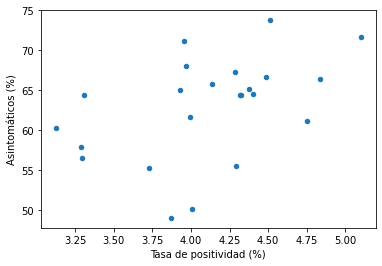

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

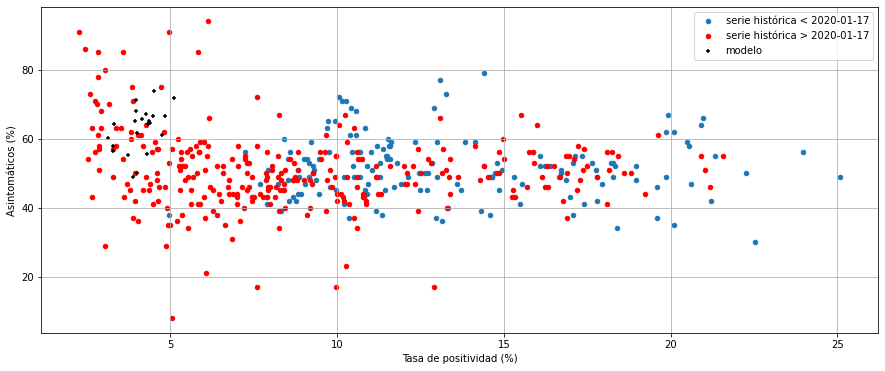

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más',
       'Nº de pacientes a los que se ha realizado pruebas'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-11-02,2021-11-03,2021-11-04,2021-11-05,2021-11-06,2021-11-07,2021-11-08,2021-11-09,2021-11-10,2021-11-11
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,105.000000,144.000000,1.230000e+02,152.000000,80.000000,49.000000,131.000000,155.000000,171.000000,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,2285.000000,2600.000000,2.094000e+03,3067.000000,2237.000000,937.000000,2461.000000,2626.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,4.600000,5.540000,5.870000e+00,4.960000,3.580000,5.230000,5.320000,5.900000,NaN,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,59.850000,48.960000,6.888000e+01,80.560000,68.000000,29.400000,70.740000,91.450000,NaN,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,60.000000,119.000000,1.010000e+02,116.000000,68.000000,34.000000,72.000000,108.000000,NaN,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,19.000000,38.000000,2.300000e+01,36.000000,19.000000,7.000000,15.000000,23.000000,NaN,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,2.000000,6.000000,1.000000e+01,13.000000,4.000000,4.000000,11.000000,14.000000,NaN,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,15.000000,15.000000,1.600000e+01,10.000000,7.000000,6.000000,13.000000,19.000000,NaN,NaN


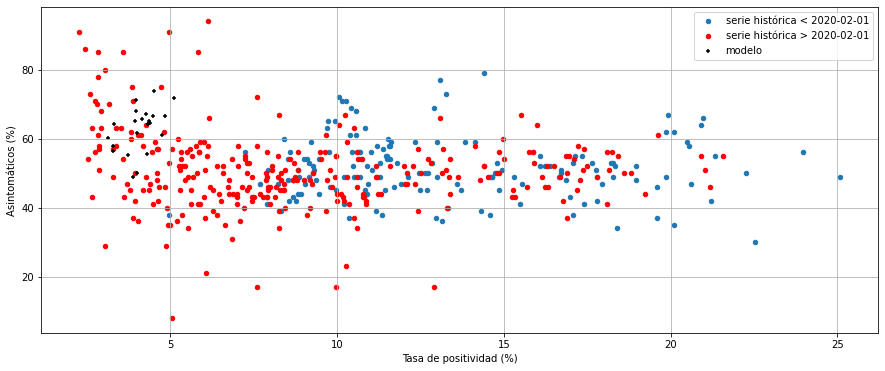

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.000000,-0.083247
Asintomáticos (%),-0.083247,1.000000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

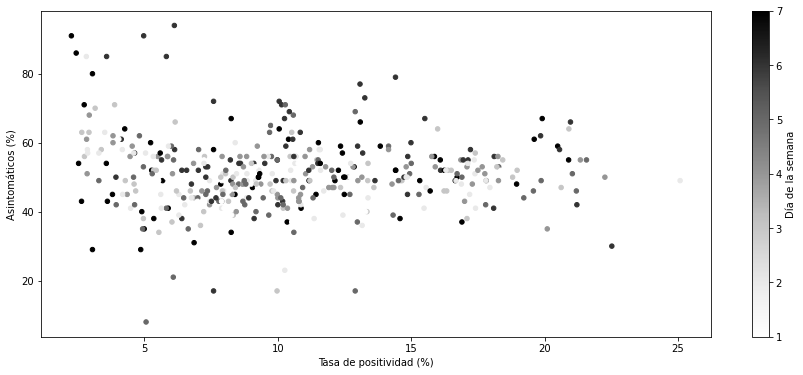

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-10-30,2021-10-31,2021-11-01,2021-11-02,2021-11-03,2021-11-04,2021-11-05,2021-11-06,2021-11-07,2021-11-08,...,2021-11-12,2021-11-13,2021-11-14,2021-11-15,2021-11-16,2021-11-17,2021-11-18,2021-11-19,2021-11-20,2021-11-21
Casos,61.431530,44.525798,80.946112,122.345620,134.511233,150.747522,156.588289,125.435438,87.740536,149.092755,...,225.236708,169.095878,111.802563,181.380093,249.010678,247.833818,251.717135,237.667941,176.430558,116.721865
test coresp,1486.904230,1131.607275,2014.886444,2669.495913,2825.932982,2739.572908,2772.482257,2020.955282,1473.216698,2523.961563,...,3158.210978,2296.274991,1658.122685,2799.486557,3550.347251,3566.651474,3254.366959,3078.618011,2178.909885,1540.731794
Tasa de positividad (%),4.513393,3.967225,3.930160,4.317157,4.372448,4.832387,4.749575,5.098004,4.482754,4.322745,...,3.995888,3.955702,3.303884,3.126363,3.289559,3.293389,3.725975,3.870663,4.293488,4.005016
Asintomáticos,46.480666,30.224144,50.573962,70.428630,74.829200,82.082142,75.700741,67.544297,42.418213,69.000510,...,95.761506,82.058885,48.273795,72.267025,90.988375,84.931839,80.358090,64.382712,52.199954,30.243951
Asintomáticos (%),73.770591,67.998203,65.078698,64.391984,65.141757,66.458873,61.188479,71.713330,66.606599,64.377119,...,61.615046,71.108076,64.401418,60.214995,57.926485,56.519452,55.267814,48.997692,55.555746,50.070700
Zaragoza,40.649123,26.575890,44.068868,76.397614,88.528994,102.162173,109.152618,95.086831,64.824793,104.393479,...,167.509332,129.264204,79.587332,117.748750,174.592622,172.337482,171.009388,159.173063,121.237521,74.684606
Zaragoza (%),67.191421,63.179384,58.063795,64.119509,65.808838,66.503531,67.541941,71.080221,68.573466,64.425139,...,70.353147,72.156333,67.958839,62.421908,67.661144,67.987598,67.314429,67.223955,69.012290,65.071831
1 a 14 años,9.278103,4.990644,8.807397,15.420521,15.819281,16.987775,17.328864,14.028739,7.432097,13.083044,...,27.172574,22.578260,12.048707,20.955294,36.198991,36.002435,36.881951,35.311400,27.539463,13.869893
15 a 24 años,2.305438,4.699818,14.938843,30.465546,43.931980,55.172470,61.195802,48.427333,31.932710,56.784693,...,79.215374,52.740246,30.331437,48.680974,64.502927,66.844049,64.782861,58.593215,40.726777,25.168598
25 a 34 años,9.632113,6.577685,11.696992,17.136384,18.965335,21.419731,23.522927,17.613358,12.349331,21.939158,...,38.147624,27.124443,17.799186,29.391763,39.717984,39.341520,38.956234,37.093678,25.028551,15.889017


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

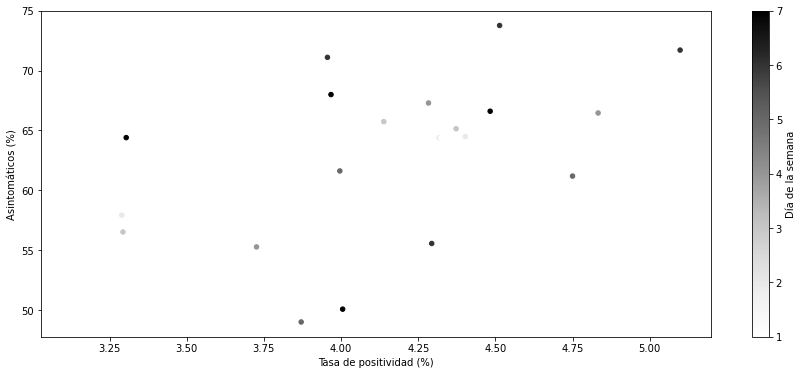

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

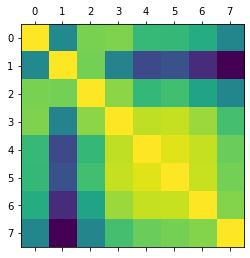

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

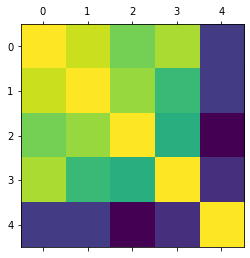

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

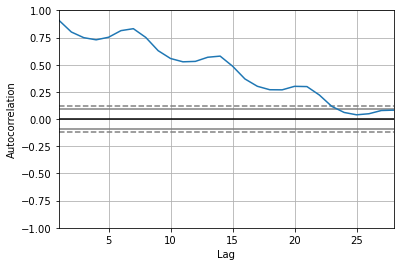

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

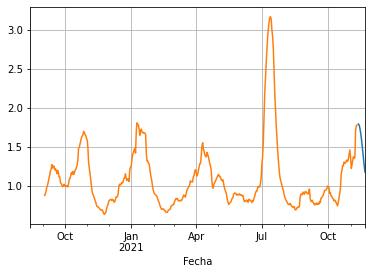

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

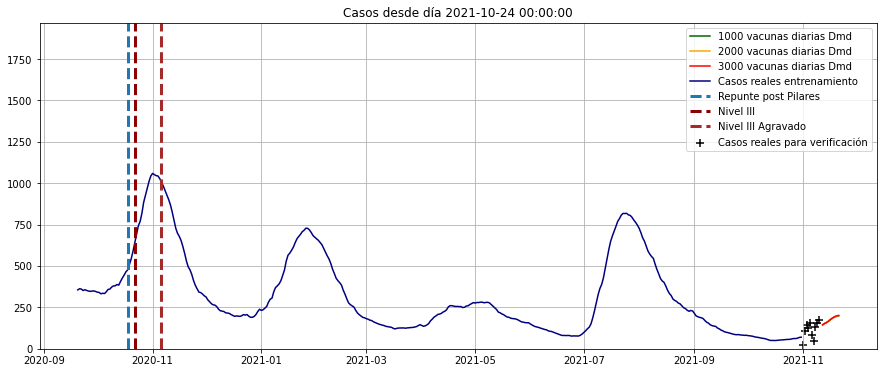

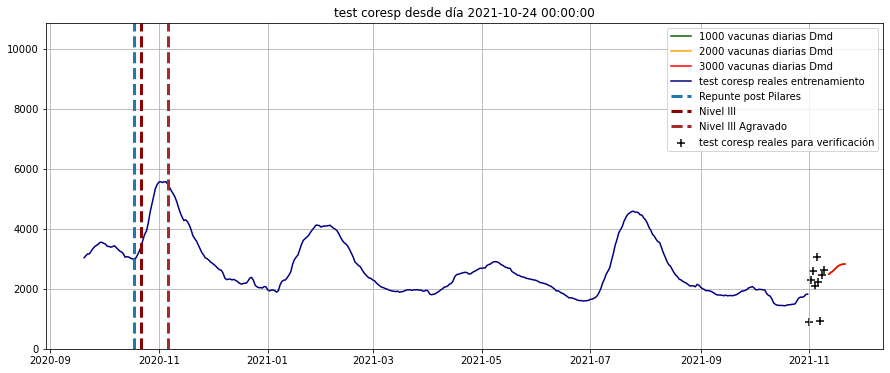

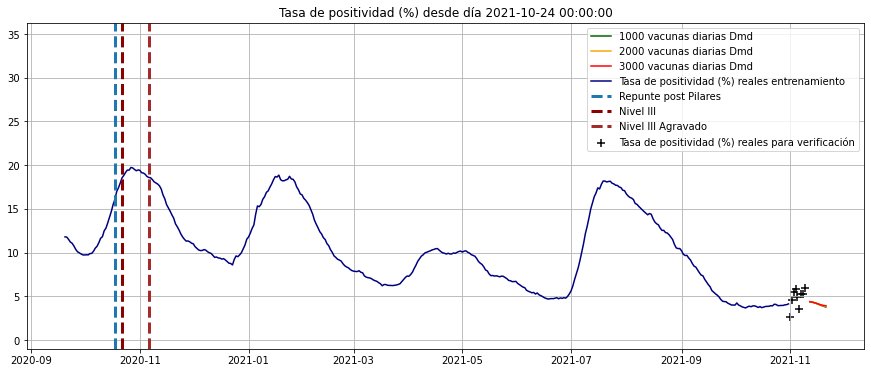

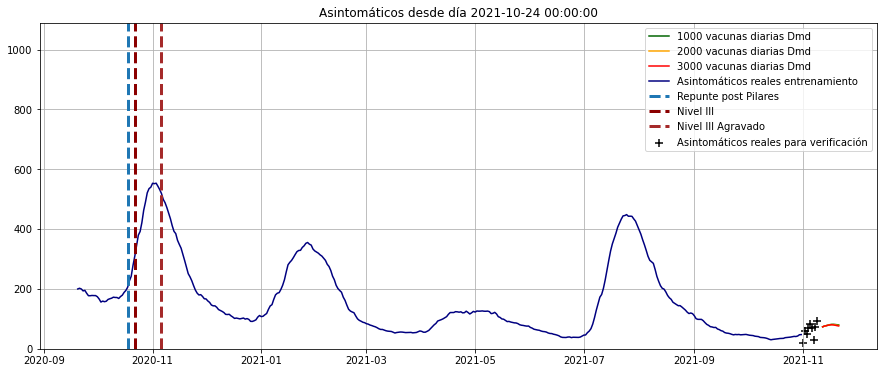

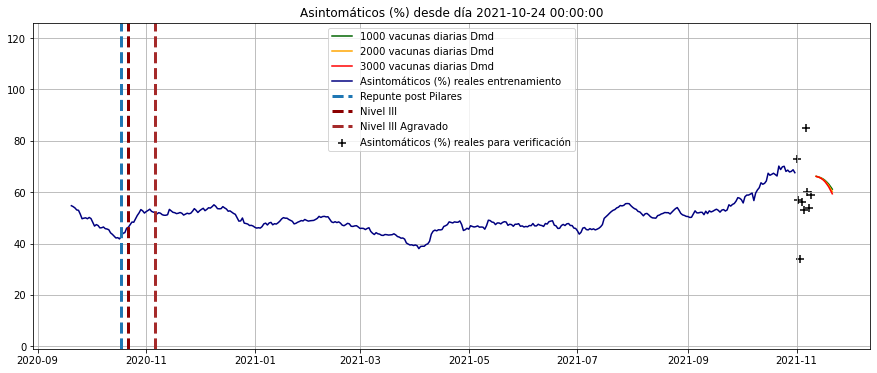

...

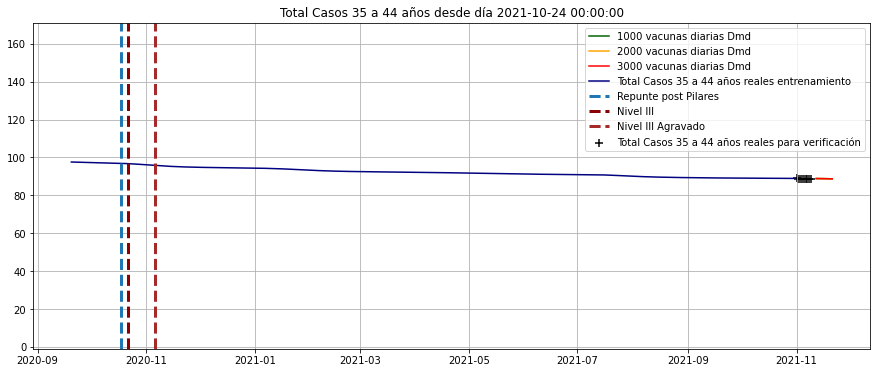

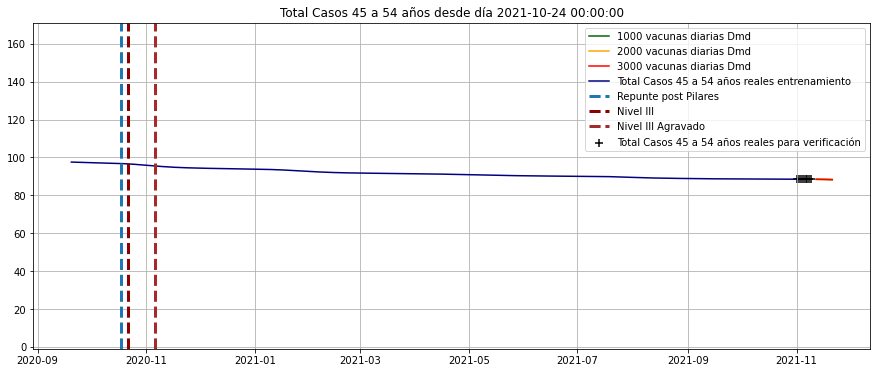

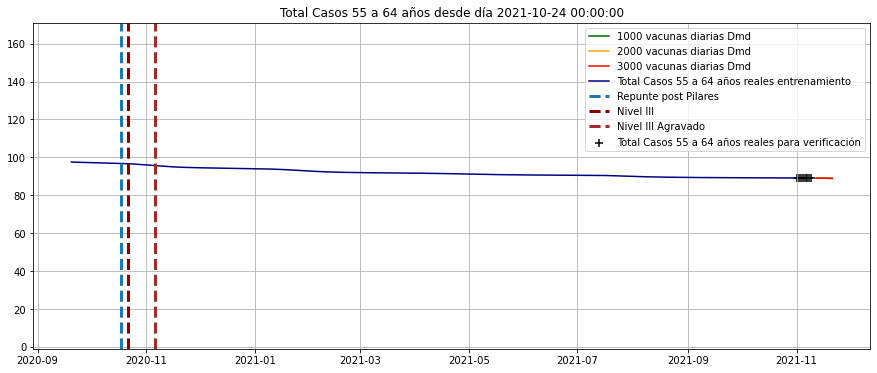

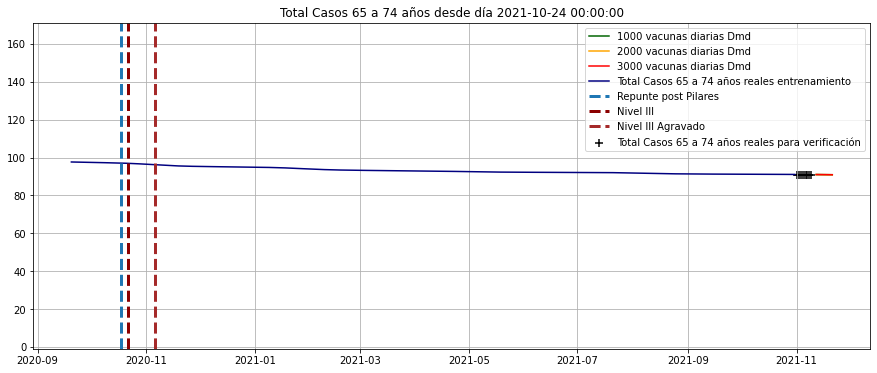

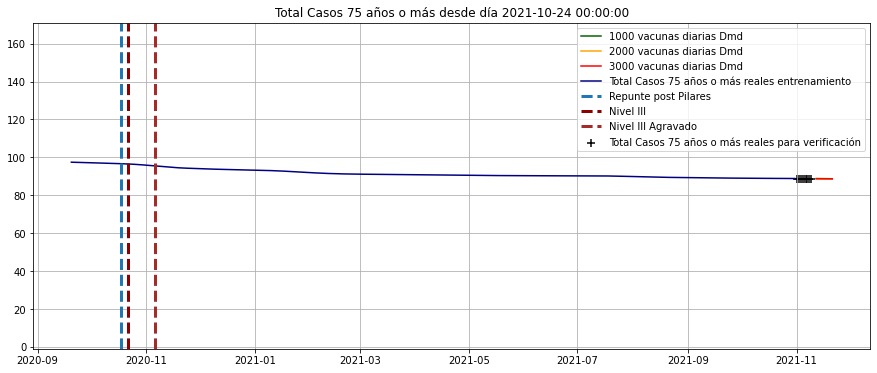

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

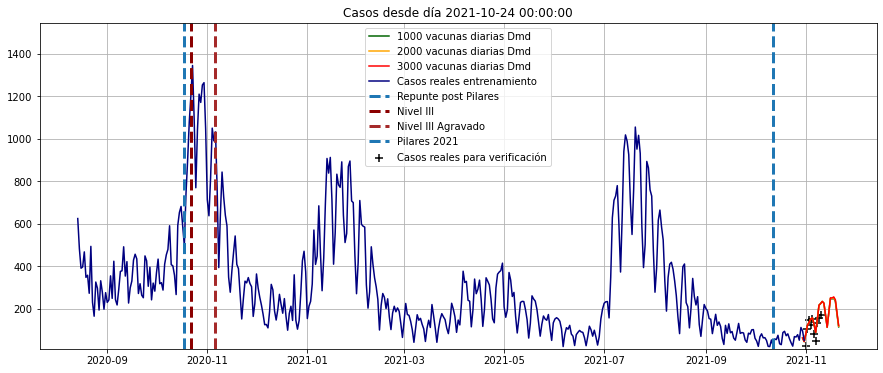

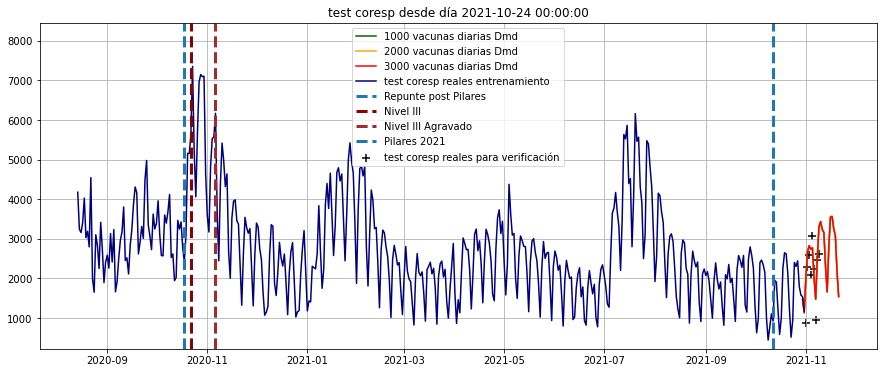

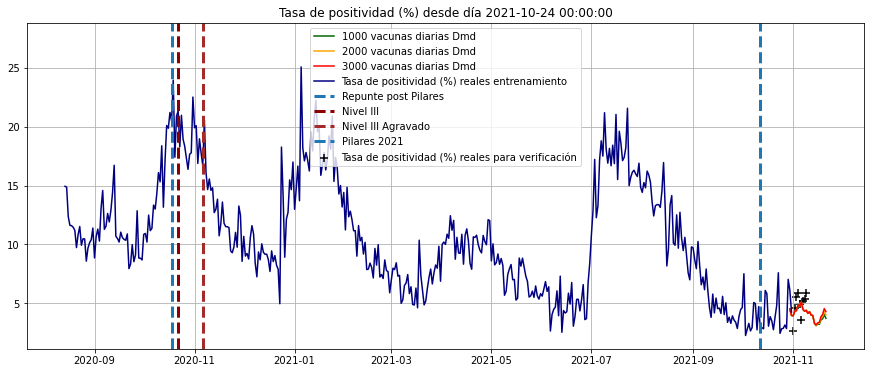

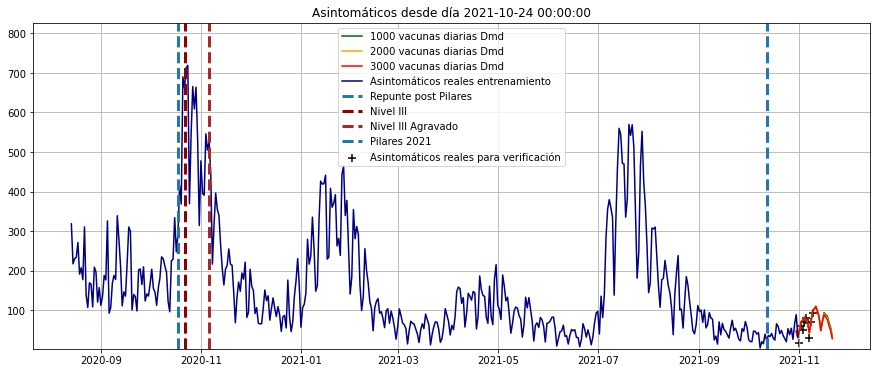

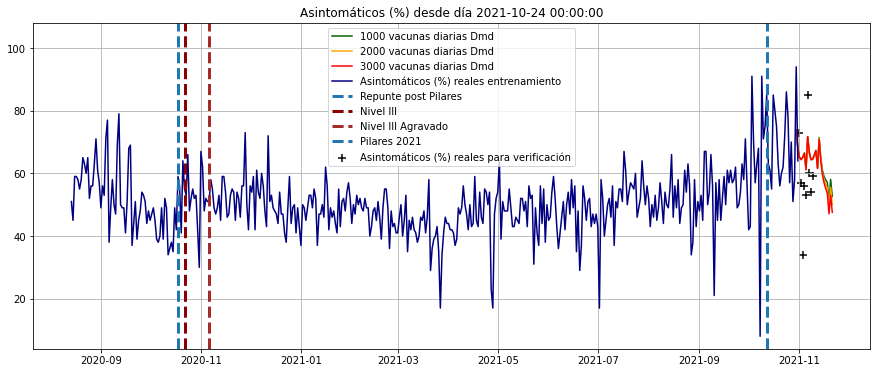

...

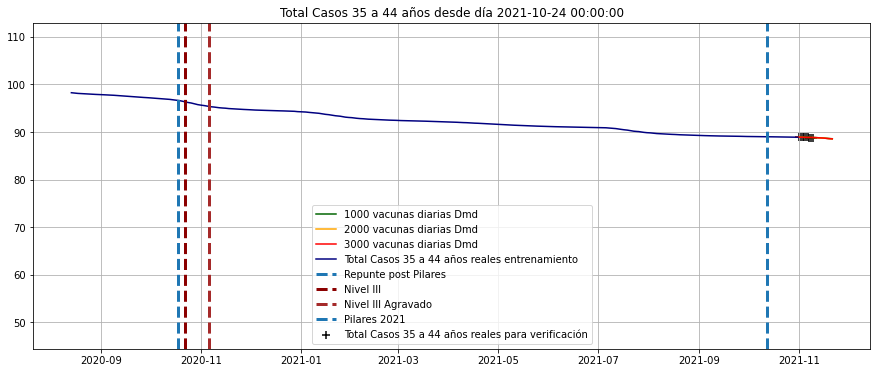

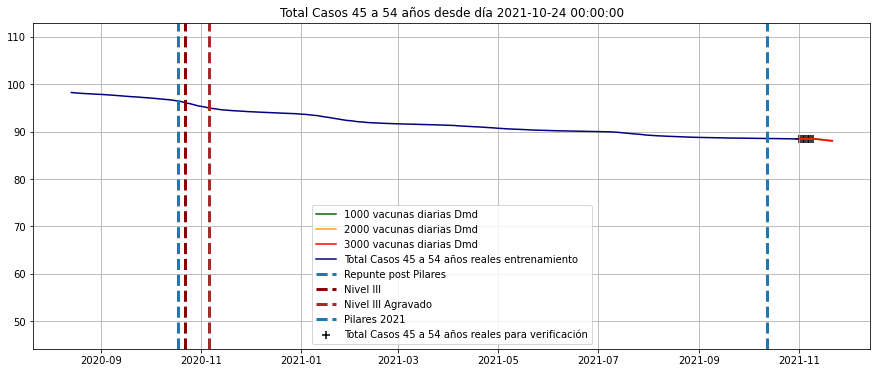

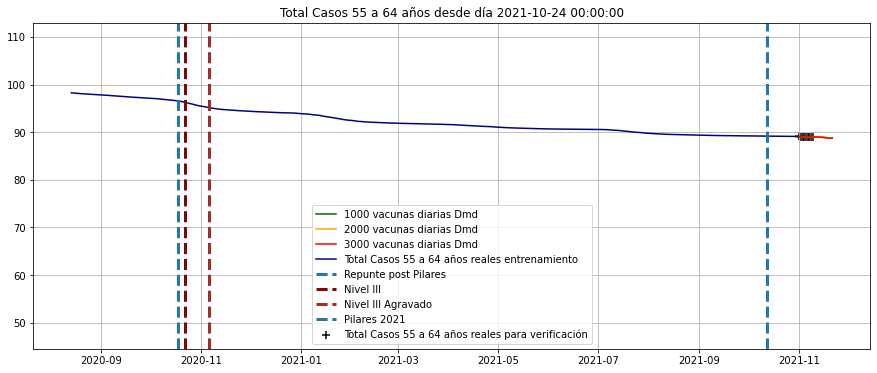

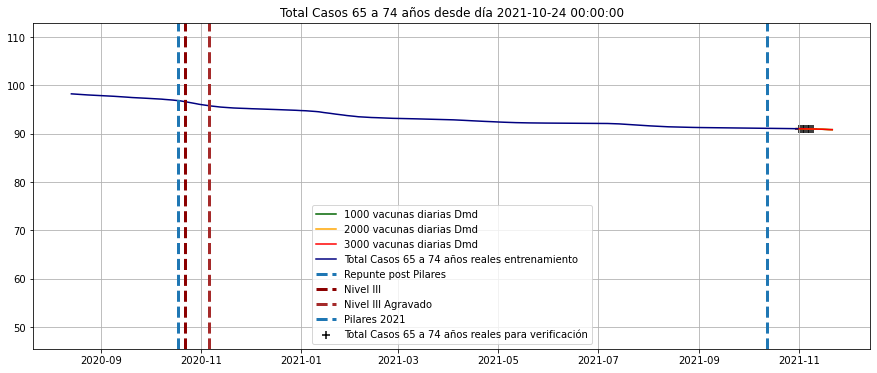

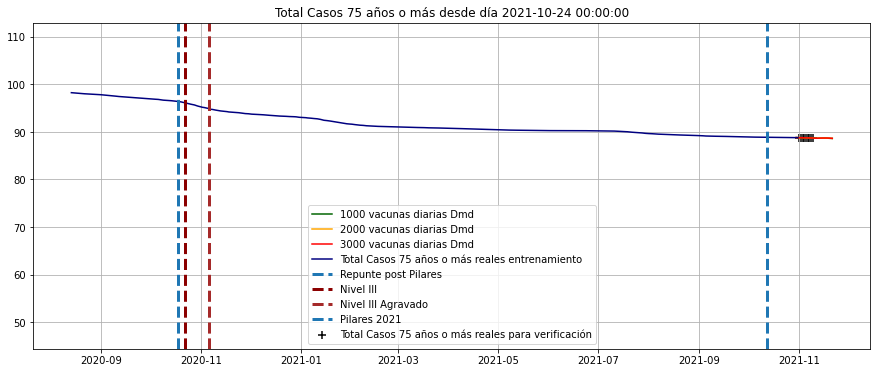

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axvline(pd.Timestamp('2021-10-12'),lw=3,ls='--',label='Pilares 2021')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Asintomáticos (%)
Fecha,,,
2021-03-19,-0.000683,0.000071,0.000280
2021-03-20,-0.000675,0.000036,0.002118
2021-03-21,-0.000464,0.000030,0.001050
2021-03-22,-0.001272,0.000142,-0.000588
2021-03-23,-0.001136,0.000133,-0.000754
2021-03-24,-0.000855,0.000104,-0.000624
2021-03-25,-0.000452,0.000044,0.000470
2021-03-26,-0.000974,0.000118,-0.000813
2021-03-27,-0.000471,0.000067,-0.000916


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Asintomáticos (%)
Casos,0.733844,0.014218,0.622168


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-11-09
Casos,155.0
test coresp,2626.0
Asintomáticos (%),59.0


Fecha,2021-11-10
Casos,187.789575


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,178.992452


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,314.421717
2021-04-18,249.433524
2021-04-19,132.786631
2021-04-20,204.066230


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,427.818624
2020-08-17,396.0,367.806801
2020-08-18,467.0,375.764305
2020-08-19,347.0,436.074300
2020-08-20,357.0,331.900304
...,...,...
2021-11-06,80.0,188.125067
2021-11-07,49.0,143.396917
2021-11-08,131.0,86.610469


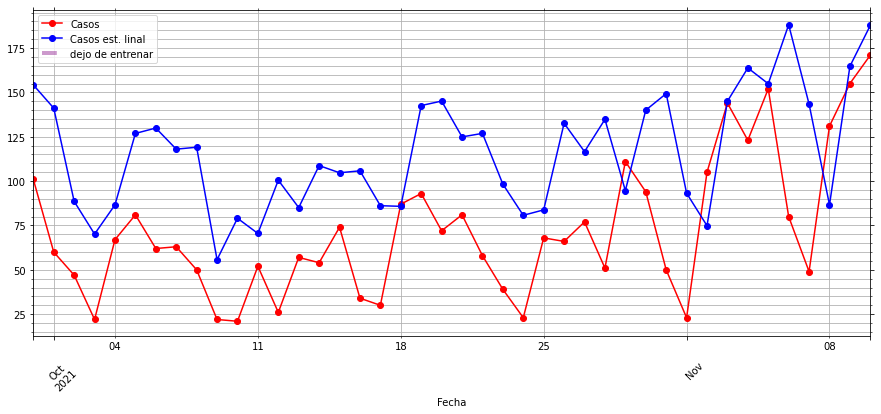

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

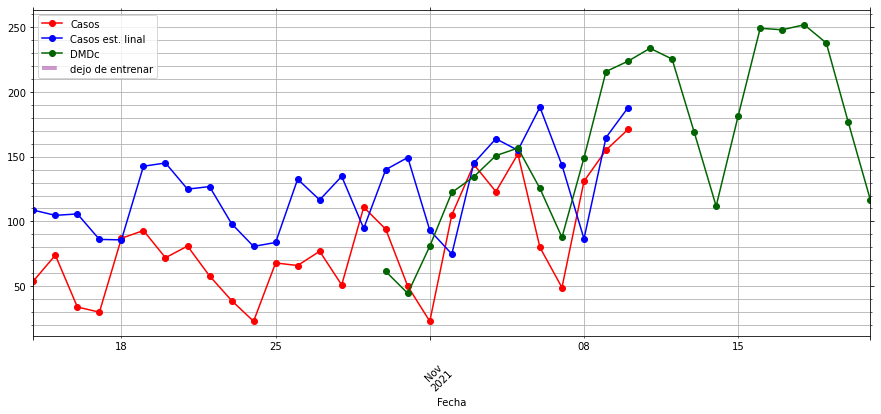

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(13.298425512514717, 115.13699412167823)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      #'Nº de pacientes a los que se ha realizado pruebas',
                      'Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

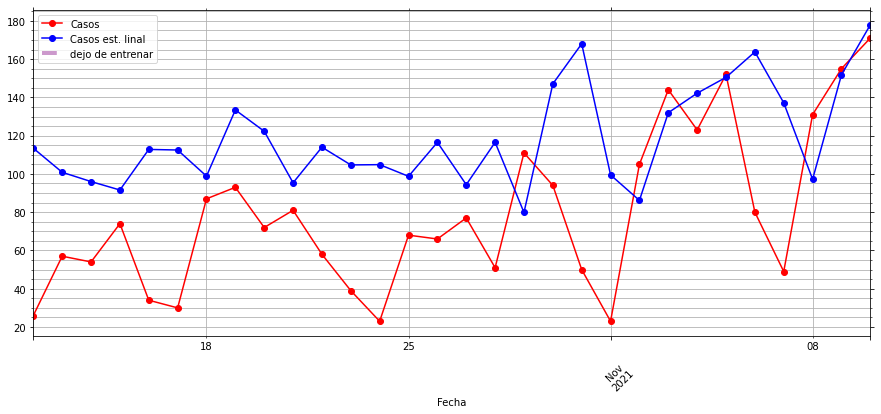

(-8.253699313871827, 109.4745150266987)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-04-26 00:00:00 -51.87467692233998 121.58005371632122
2021-04-27 00:00:00 -17.875064176628534 177.54692508542573
2021-04-28 00:00:00 -35.439328569151066 118.26065388420074
2021-04-29 00:00:00 -41.14636497805063 166.21535557431196
2021-04-30 00:00:00 314.96467991169976 264.48779784691084
2021-05-01 00:00:00 314.96467991169976 264.48779784691084
2021-05-02 00:00:00 314.96467991169976 264.48779784691084
2021-05-03 00:00:00 314.96467991169976 264.48779784691084
2021-05-04 00:00:00 314.96467991169976 264.48779784691084
2021-05-05 00:00:00 314.96467991169976 264.48779784691084
2021-05-06 00:00:00 314.96467991169976 264.48779784691084
2021-05-07 00:00:00 314.96467991169976 264.48779784691084
2021-05-08 00:00:00 314.96467991169976 264.48779784691084
2021-05-09 00:00:00 314.96467991169976 264.48779784691084
2021-05-10 00:00:00 314.96467991169976 264.48779784691084
2021-05-11 00:00:00 314.96467991169976 264.48779784691084
2021-05-12 00:00:00 314.96467991169976 264.48779784691084
2021-05-13 0

2021-09-29 00:00:00 314.96467991169976 264.48779784691084
2021-09-30 00:00:00 314.96467991169976 264.48779784691084
2021-10-01 00:00:00 314.96467991169976 264.48779784691084
2021-10-02 00:00:00 314.96467991169976 264.48779784691084
2021-10-03 00:00:00 314.96467991169976 264.48779784691084
2021-10-04 00:00:00 314.96467991169976 264.48779784691084
2021-10-05 00:00:00 314.96467991169976 264.48779784691084
2021-10-06 00:00:00 314.96467991169976 264.48779784691084
2021-10-07 00:00:00 314.96467991169976 264.48779784691084
2021-10-08 00:00:00 314.96467991169976 264.48779784691084
2021-10-09 00:00:00 314.96467991169976 264.48779784691084
2021-10-10 00:00:00 314.96467991169976 264.48779784691084
2021-10-11 00:00:00 314.96467991169976 264.48779784691084
2021-10-12 00:00:00 314.96467991169976 264.48779784691084
2021-10-13 00:00:00 314.96467991169976 264.48779784691084
2021-10-14 00:00:00 314.96467991169976 264.48779784691084
2021-10-15 00:00:00 314.96467991169976 264.48779784691084
2021-10-16 00:

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-08-28 00:00:00 3.7180330909148176 108.93884669715756
2021-08-29 00:00:00 3.3262547674562626 108.9610570324389
2021-08-30 00:00:00 2.9493922701517525 108.9814460240179
2021-08-31 00:00:00 3.099541471677751 108.9744645741867
2021-09-01 00:00:00 3.203591113403821 108.96959854016676
2021-09-02 00:00:00 3.4977189601038385 108.95476619507974
2021-09-03 00:00:00 3.5484518108942016 108.95213424698653
2021-09-04 00:00:00 4.2933026349496695 108.92364214335065
2021-09-05 00:00:00 4.167011015367847 108.92713219022549
2021-09-06 00:00:00 3.9490681435272665 108.93865864549853
2021-09-07 00:00:00 4.329223931164187 108.91858330087155
2021-09-08 00:00:00 4.352020658802083 108.91751841948602
2021-09-09 00:00:00 4.571250760641763 108.90885730435727
2021-09-10 00:00:00 4.7083154833392395 108.89754459129645
2021-09-11 00:00:00 5.014059181767278 108.88488920120281
2021-09-12 00:00:00 4.682337607056172 108.89827840297899
2021-09-13 00:00:00 5.005874656223733 108.88204671222886
2021-09-14 00:00:00 4.8127

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-05-09,2021-05-10,2021-05-11,2021-05-12,2021-05-13,2021-05-14,2021-05-15,2021-05-16,2021-05-17,2021-05-18,...,2021-10-31,2021-11-01,2021-11-02,2021-11-03,2021-11-04,2021-11-05,2021-11-06,2021-11-07,2021-11-08,2021-11-09
Casos,85.00,154.00,229.00,234.00,233.00,196.0,148.00,61.00,131.00,260.00,...,50.00,23.00,105.00,144.00,123.00,152.00,80.00,49.00,131.00,155.00
test coresp,1496.00,2558.00,3072.00,2955.00,2809.00,2801.0,2108.00,1158.00,2414.00,2942.00,...,1173.00,883.00,2285.00,2600.00,2094.00,3067.00,2237.00,937.00,2461.00,2626.00
Tasa de positividad (%),5.68,6.02,7.45,7.92,8.29,7.0,7.02,5.27,5.43,8.84,...,4.26,2.60,4.60,5.54,5.87,4.96,3.58,5.23,5.32,5.90
Asintomáticos (%),49.00,43.00,43.00,46.00,45.00,44.0,52.00,52.00,48.00,51.00,...,64.00,73.00,57.00,34.00,56.00,53.00,85.00,60.00,54.00,59.00
Casos$^{{-\Delta t}}$,164.00,85.00,154.00,229.00,234.00,233.0,196.00,148.00,61.00,131.00,...,94.00,50.00,23.00,105.00,144.00,123.00,152.00,80.00,49.00,131.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Asintomáticos (%)$^{-26\cdot \Delta t}$,42.00,50.00,43.00,44.00,59.00,45.0,43.00,54.00,46.00,44.00,...,57.00,63.00,68.00,8.00,91.00,71.00,75.00,85.00,63.00,61.00
Casos$^{-27\cdot \Delta t}$,194.00,339.00,270.00,291.00,334.00,244.0,116.00,194.00,345.00,329.00,...,67.00,81.00,62.00,63.00,50.00,22.00,21.00,52.00,26.00,57.00
test coresp$^{-27\cdot \Delta t}$,2099.00,3122.00,3245.00,2699.00,2950.00,2368.0,1383.00,2458.00,3241.00,3107.00,...,2402.00,2462.00,2343.00,2149.00,989.00,443.00,767.00,1104.00,921.00,1950.00
Tasa de positividad (%)$^{-27\cdot \Delta t}$,9.24,10.86,8.32,10.78,11.32,10.3,8.39,7.89,10.64,10.59,...,2.79,3.29,2.65,2.93,5.06,4.97,2.74,4.71,2.82,2.92


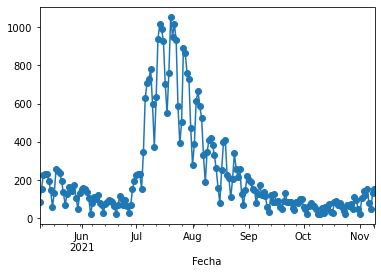

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', 'Tasa de positividad (%)',
                   #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 28
entrenoDesde = '2021-05-9'
entrenoHasta = '2021-11-9'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-09,-0.000058,0.000016,-0.004516,0.000633,-0.000022,-0.000020,-0.006785,0.000598,-0.000224,0.000038,...,-0.002207,0.000081,0.000329,-0.000020,-0.006074,-0.000450,-0.000184,-0.000021,0.003051,0.000582
2021-05-10,-0.000746,0.000065,0.014477,0.000129,0.000364,-0.000017,-0.009582,0.000773,0.000008,-0.000024,...,-0.004690,0.000847,-0.000140,-0.000004,-0.008901,0.000243,-0.000099,0.000007,0.004419,-0.000475
2021-05-11,0.000053,-0.000011,0.003239,0.000237,-0.000717,0.000061,0.010833,0.000416,0.000389,-0.000010,...,0.003888,-0.000398,-0.000023,-0.000034,-0.002740,0.000718,-0.000182,0.000004,-0.005163,0.000213
2021-05-12,-0.000048,0.000011,0.001271,-0.000001,-0.000043,-0.000014,0.006539,0.000361,-0.000677,0.000056,...,-0.000773,0.001000,0.000397,0.000001,0.001206,-0.000507,-0.000251,-0.000024,-0.002041,0.000560
2021-05-13,-0.000008,0.000024,-0.007603,-0.001089,-0.000139,0.000019,0.009896,-0.000517,0.000355,-0.000055,...,-0.000382,-0.001575,0.000142,-0.000008,-0.010689,0.001592,-0.000230,0.000026,0.008452,-0.000507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-05,-0.000486,0.000089,0.007694,-0.001520,-0.000044,-0.000027,-0.003308,-0.000262,0.000476,-0.000010,...,0.008355,0.000333,-0.000048,-0.000004,-0.003814,0.000070,0.000192,-0.000017,0.004562,0.000947
2021-11-06,-0.000023,0.000009,-0.005546,0.000376,-0.000386,0.000091,0.007835,-0.002125,-0.000298,-0.000014,...,-0.019280,0.001467,0.000025,-0.000003,0.009972,0.000452,0.000166,-0.000030,-0.008232,0.000512
2021-11-07,0.000199,-0.000030,-0.002464,0.000125,-0.000223,0.000030,-0.000902,0.000256,-0.000317,0.000086,...,0.004544,-0.000421,0.000465,-0.000121,-0.015831,0.001501,0.000185,-0.000023,0.001943,0.000525


In [94]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Casos,0.605841,0.016379,7.607775,-0.551118,-0.526959,-0.000831,2.063838,0.268466,0.573603,-0.005365,...,-1.851387,0.920955,0.291949,-0.022404,-2.581009,0.028347,-0.432696,0.037387,10.055609,0.185743


In [95]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,8.31,48.0,334.0,3634.0,9.19,48.0,370.0,4377.0,...,9.27,50.0,235.0,2216.0,10.6,56.0,239.0,2734.0,8.74,49.0


,Casos est. lineal
Fecha,
2021-05-07,271.600771


In [96]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-05-14    196.0
2021-05-15    148.0
2021-05-16     61.0
2021-05-17    131.0
2021-05-18    260.0
              ...  
2021-11-06     80.0
2021-11-07     49.0
2021-11-08    131.0
2021-11-09    155.0
2021-11-10    171.0
Name: Casos, Length: 181, dtype: float64

In [97]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-05-14,202.973399
2021-05-15,163.275032
2021-05-16,81.546021
2021-05-17,124.650189
2021-05-18,216.461942
...,...
2021-11-06,89.690243
2021-11-07,41.984048
2021-11-08,174.969639


In [98]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-11-10'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-05-14,196.0,202.973399
2021-05-15,148.0,163.275032
2021-05-16,61.0,81.546021
2021-05-17,131.0,124.650189
2021-05-18,260.0,216.461942
...,...,...
2021-11-06,80.0,89.690243
2021-11-07,49.0,41.984048
2021-11-08,131.0,174.969639


In [99]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-05-14 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-11-04,123.0,160.606546,150.747522
2021-11-05,152.0,154.582293,156.588289
2021-11-06,80.0,89.690243,125.435438
2021-11-07,49.0,41.984048,87.740536
2021-11-08,131.0,174.969639,149.092755
2021-11-09,155.0,145.098887,215.633595
2021-11-10,171.0,152.904683,223.611705
2021-11-11,NaN,NaN,233.590150
2021-11-12,NaN,NaN,225.236708
2021-11-13,NaN,NaN,169.095878


(0.31669139615110226, 27.368082189121335)

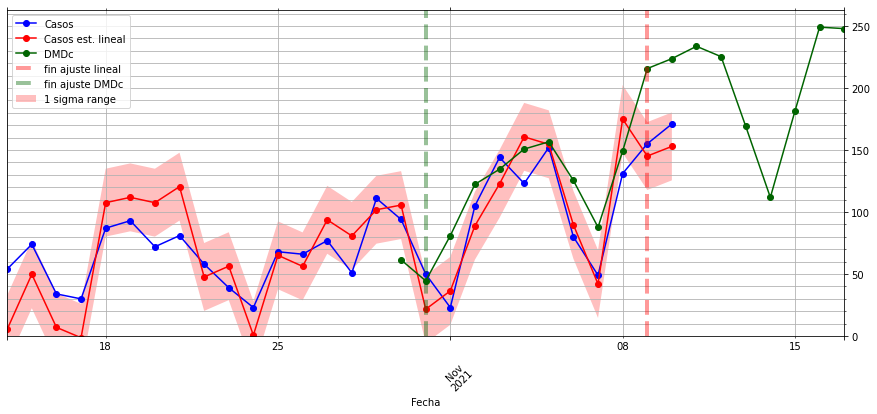

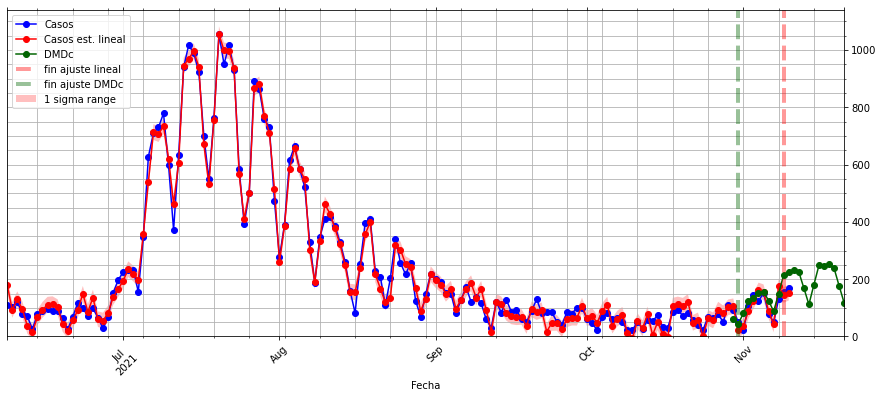

In [100]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

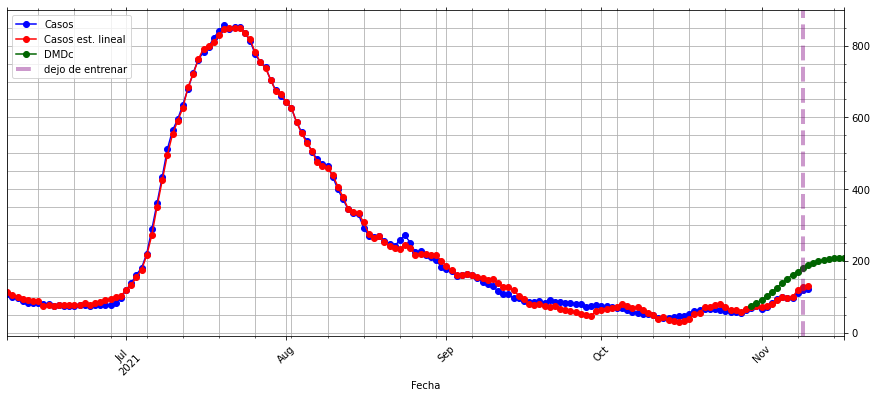

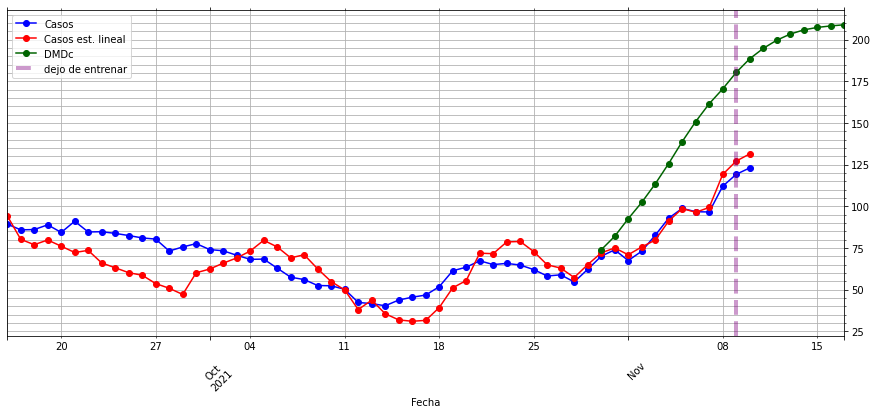

In [101]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [102]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(0.31669139615110226, 27.368082189121335)

In [103]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

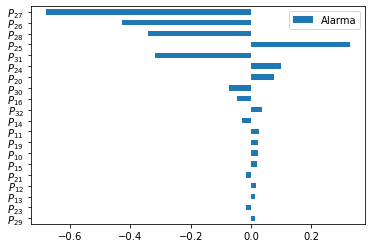

In [104]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

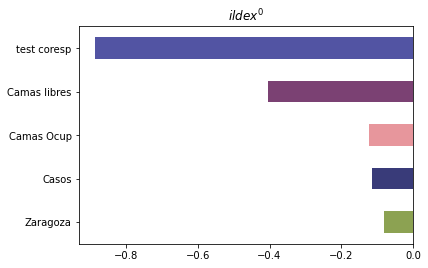

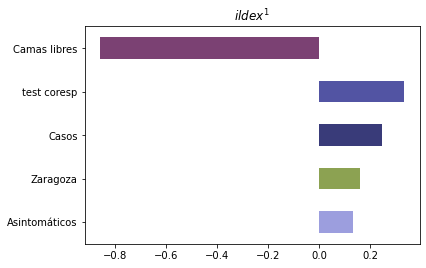

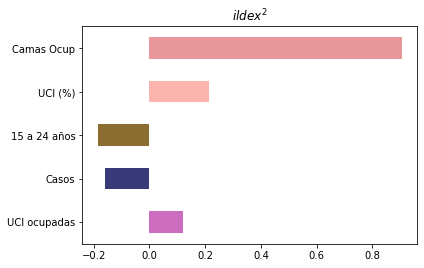

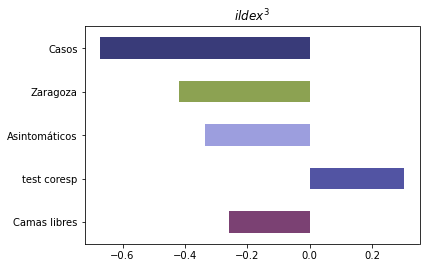

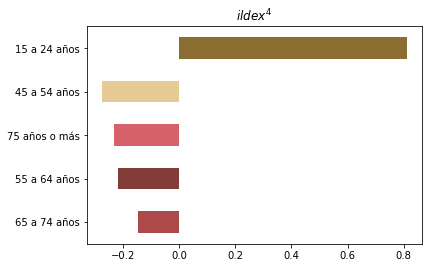

...

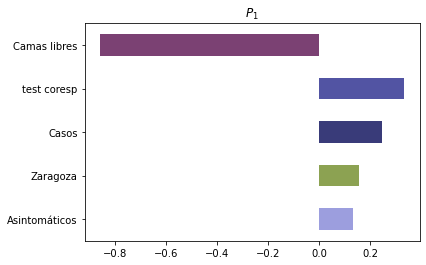

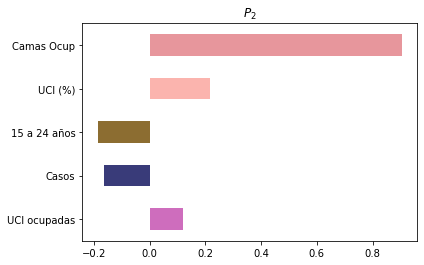

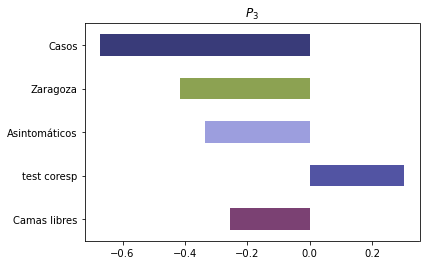

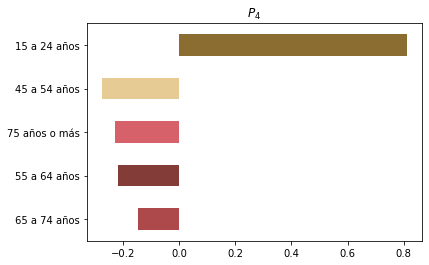

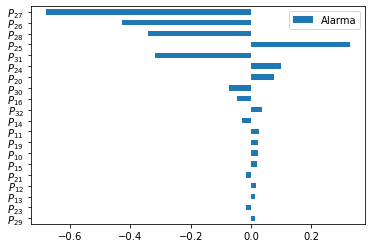

KeyError: 'Total Casos 75 años o más'

In [105]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes